In [1]:
import tensorflow as tf
import os
import numpy as np
import matplotlib.pyplot as plt
import time
import cv2
from tensorflow.keras import layers
from keras.models import Model, Sequential
from tensorflow.keras.applications import VGG19
from keras.layers import Dense, Conv2D, Flatten, BatchNormalization, LeakyReLU
from keras.layers import Conv2DTranspose, Dropout, ReLU, Input, Concatenate, ZeroPadding2D
from keras.optimizers import Adam
from keras.utils import plot_model
# from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow_addons as tfa


/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [2]:
import tensorflow as tf

physical_devices = tf.config.list_physical_devices('GPU')
if len(physical_devices) == 0:
    print("No GPU devices found. Make sure your GPU is properly installed and configured.")
else:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
    print("GPU configured successfully.")

GPU configured successfully.


In [3]:
import tensorflow as tf

# Check available GPUs
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    # Restrict TensorFlow to only allocate GPU memory growth
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
        print("GPU memory growth set to True")
    except RuntimeError as e:
        print(e)

GPU memory growth set to True


In [4]:
import tensorflow as tf

# Check if TensorFlow can access GPU
num_gpus = len(tf.config.experimental.list_physical_devices('GPU'))

if num_gpus > 0:
    print("Num GPUs Available: ", num_gpus)
    print("TensorFlow is using GPU.")
else:
    print("No GPU available. TensorFlow is using CPU.")

Num GPUs Available:  1
TensorFlow is using GPU.


In [5]:
def load(image_file):
    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.cast(image,tf.float32)
    return image

In [6]:
path = "/kaggle/input/places365/val_256/"
x = load(os.path.join(path, 'train_samples/Places365_val_00000012.jpg'))
print(x.shape)

(256, 256, 3)


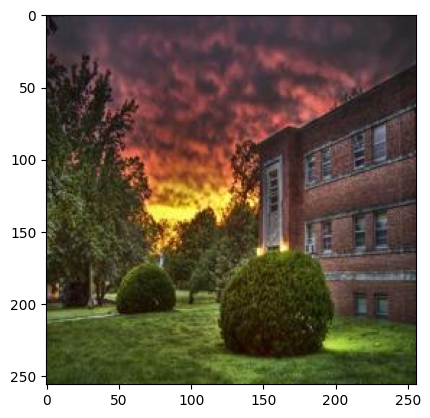

In [7]:
plt.imshow(x/255.0)

In [8]:
def normalize(real_image):
    real_image = (real_image / 255)
    return real_image

In [9]:
def random_crop(real_image):
    cropped_image = tf.image.random_crop(real_image, size = [256, 256, 3])
    return cropped_image

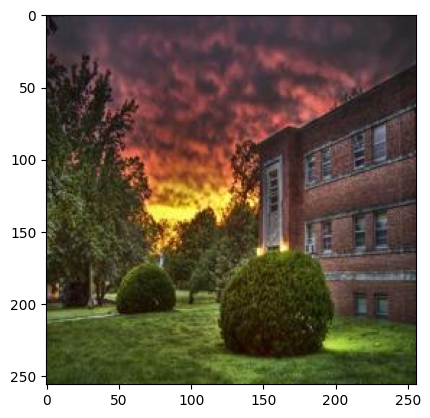

In [10]:
x_aug = random_crop(x)
plt.imshow(x_aug/255.0)

In [11]:
def resize(real_image):
    real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    return real_image
def resize_300(real_image):
    real_image = tf.image.resize(real_image, [300, 300], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    return real_image

In [12]:
def rotate_image(image, angles, interpolation='BILINEAR'):
    """
    Rotate an image tensor by specified angles.

    Args:
    - image: Input image tensor with shape (batch_size, height, width, channels).
    - angles: Tensor of rotation angles in radians for each image in the batch.
    - interpolation: Interpolation method ('BILINEAR' or 'NEAREST').

    Returns:
    - Rotated image tensor.
    """
    batch_size, height, width, channels = tf.unstack(tf.shape(image))

    # Coordinates of the center of the image
    center_x = tf.cast(width, tf.float32) / 2.0
    center_y = tf.cast(height, tf.float32) / 2.0

    # Define transformation matrix
    rotation_matrix = tf.reshape(tf.stack([tf.cos(angles), -tf.sin(angles), center_x * (1 - tf.cos(angles)) + center_y * tf.sin(angles),
                                           tf.sin(angles), tf.cos(angles), -center_x * tf.sin(angles) + center_y * (1 - tf.cos(angles)),
                                           0.0, 0.0, 1.0], axis=1), shape=(-1, 3, 3))

    # Apply rotation to each pixel
    rotated_image = tfa.image.transform(image, rotation_matrix, interpolation)

    return rotated_image


In [13]:
def random_jitter(real_image):
    if tf.random.uniform(()) > 0.5:
        real_image = tf.image.flip_left_right(real_image)
    return real_image

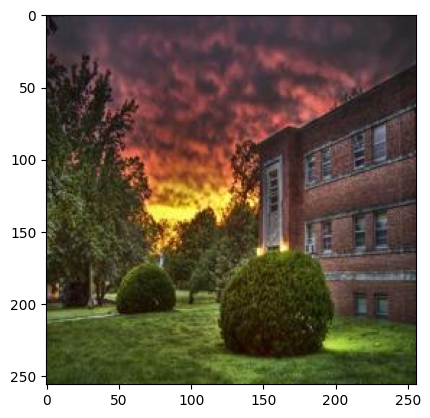

In [14]:
x_jitter = random_jitter(x)
plt.imshow(x_jitter/255.0)

In [15]:
def load_train_images(image_path):
    real_image = load(image_path)
    real_image = resize_300(real_image)
    real_image = tf.image.random_brightness(real_image, 0.2)
    real_image = random_crop(real_image)
    # Define the rotation angle in radians
    rotation_angle = tf.constant(20.0 * (3.141592653589793 / 180.0), dtype=tf.float32)

    # Apply the rotation using tfa.image.rotate
    real_image = tfa.image.rotate(real_image, angles=rotation_angle)

#     # Example usage
#     angles = tf.placeholder(dtype=tf.float32, shape=(None,))
#     # Specify the rotation range in degrees
#     rotation_range = 15  # Adjust this value as needed
#     # Convert the rotation range to radians
#     rotation_range_rad = rotation_range * (np.pi / 180.0)
#     # Generate random rotation angles for each image in the batch
#     random_angles = tf.random.uniform(shape=(tf.shape(image)[0],), minval=-rotation_range_rad, maxval=rotation_range_rad)
#     # Apply custom rotation to the image with bilinear interpolation
#     real_image = rotate_image(real_image, random_angles, interpolation='BILINEAR')
    #     real_image = rotate(real_image)
    real_image = random_jitter(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [16]:
def load_test_image(image_path):
    real_image = load(image_path)
    real_image = resize(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [17]:
IMAGE_SIZE = 256
BATCH_SIZE = 32

In [18]:
# create input pipeline
train_dataset = tf.data.Dataset.list_files(path + "train_samples/*.jpg")
train_dataset = train_dataset.map(load_train_images)
train_dataset = train_dataset.shuffle(10).batch(BATCH_SIZE)
train_dataset

<_BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 1), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 2), dtype=tf.float32, name=None))>

In [19]:
validation_dataset = tf.data.Dataset.list_files(path + 'valid_samples/*.jpg')
validation_dataset = validation_dataset.map(load_test_image)
validation_dataset = validation_dataset.batch(BATCH_SIZE)
validation_dataset

<_BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 1), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 2), dtype=tf.float32, name=None))>

In [20]:
test_dataset = tf.data.Dataset.list_files(path + 'test_samples/*.jpg')
test_dataset = test_dataset.map(load_test_image)
test_dataset = test_dataset.batch(1)
test_dataset

<_BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 1), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 2), dtype=tf.float32, name=None))>

In [21]:
# downsample block
def downsample(filters, size,dropout=False, batchnorm = True):
    init = tf.random_normal_initializer(0.,0.02)
    result = Sequential()
    result.add(Conv2D(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    if batchnorm == True:
        result.add(BatchNormalization())
    if dropout == True :
        result.add(Dropout(0.3))
    result.add(LeakyReLU())
    return result
down_model = downsample(3,4)
down_result = down_model(tf.expand_dims(x, axis = 0))
print(down_result.shape)

(1, 128, 128, 3)


In [22]:
# upsample block
def upsample(filters, size, dropout = False):
    init = tf.random_normal_initializer(0, 0.02)
    result = Sequential()
    result.add(Conv2DTranspose(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    result.add(BatchNormalization())
    if dropout == True:
        result.add(Dropout(0.3))
    result.add(ReLU())
    return result
up_model = upsample(3,4)
up_result = up_model(down_result)
print(up_result.shape)

(1, 256, 256, 3)


In [23]:
def generator(input_shape = (256,256,1), output_channels = 2):
    inputs = Input(shape = input_shape)
    down_stack = [
        downsample(64, 4, batchnorm=False),
        downsample(128, 4),
        downsample(256, 4),
        downsample(512, 4, dropout = True),
        downsample(1024, 4, dropout = True)
    ]


    up_stack = [
        upsample(1024, 4, dropout=True),
        upsample(512, 4, dropout=True),
        upsample(256, 4, dropout=True),
        upsample(128, 4),
        upsample(64, 4),
    ]
    init = tf.random_normal_initializer(0., 0.02)
    last = Conv2DTranspose(2, 4, strides = 2, padding = "same", kernel_initializer = init, activation ="tanh")
    x = inputs
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    skips = reversed(skips[:-1])

    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = Concatenate()([x, skip])

    x = last(x)
    return Model(inputs = inputs, outputs = x)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 sequential_2 (Sequential)   (None, 128, 128, 64)         1024      ['input_1[0][0]']             
                                                                                                  
 sequential_3 (Sequential)   (None, 64, 64, 128)          131584    ['sequential_2[0][0]']        
                                                                                                  
 sequential_4 (Sequential)   (None, 32, 32, 256)          525312    ['sequential_3[0][0]']        
                                                                                              

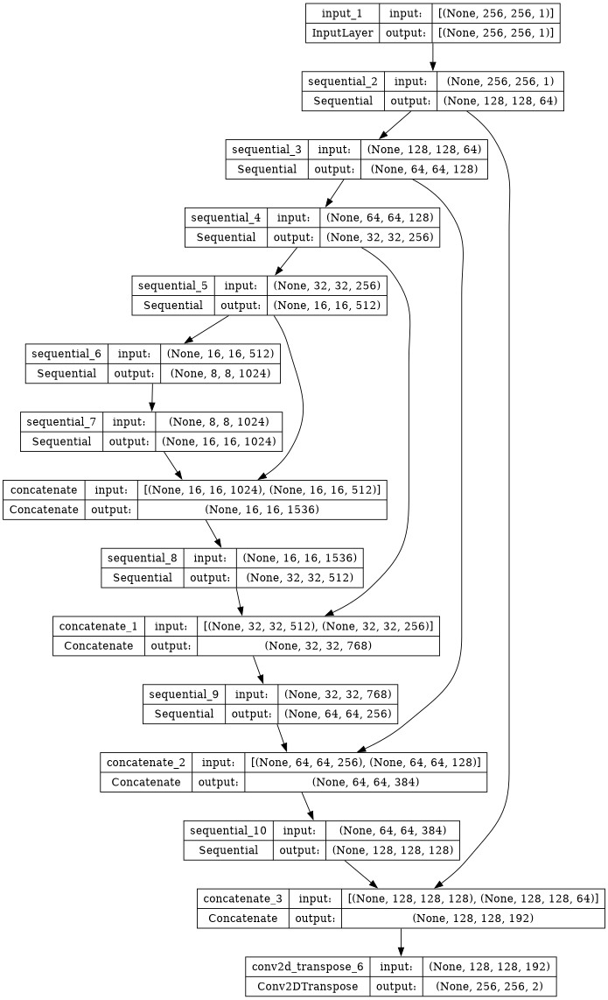

In [24]:
gen = generator()
gen.summary()
plot_model(gen, show_shapes=True, dpi = 64)

In [25]:
def discriminator():
    init = tf.random_normal_initializer(0., 0.02)

    inp = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 1], name = "input_image")
    tar = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 2], name = "target_image")
    x = Concatenate()([inp, tar])
    down1 = downsample(64,4,False)(x)
    down2 = downsample(128, 4)(down1)
    down3 = downsample(256, 4)(down2)

    zero_pad1 = ZeroPadding2D()(down3)
    conv = Conv2D(256, 4, strides = 1, kernel_initializer = init, use_bias = False)(zero_pad1)
    leaky_relu = LeakyReLU()(conv)
    zero_pad2 = ZeroPadding2D()(leaky_relu)
    last = Conv2D(1, 4, strides = 1, kernel_initializer=init)(zero_pad2)
    return Model(inputs = [inp, tar], outputs = last)

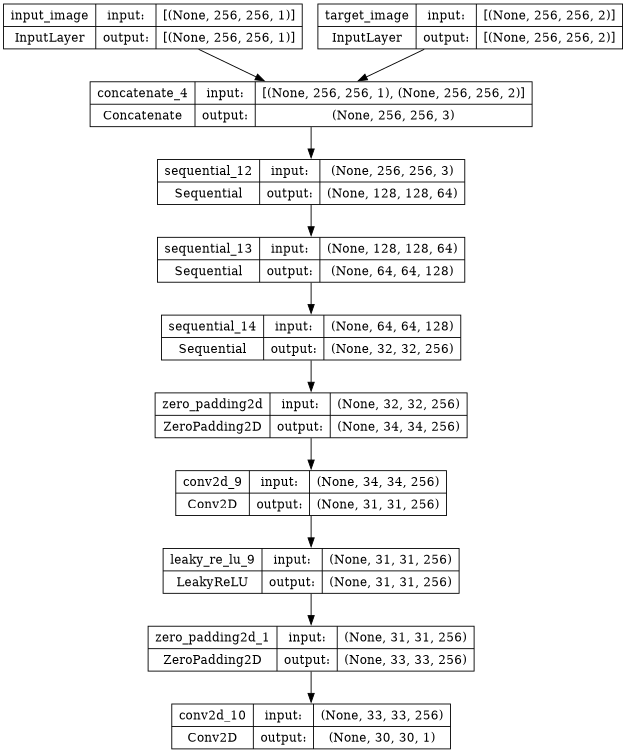

In [26]:
disc = discriminator()
plot_model(disc, show_shapes=True, dpi = 64)

In [27]:
# Function to create YUV image from Y, U, and V channels and then convert to rgb
def create_rgb_image(y_channel, uv_channel):
    # Assuming YUV format where Y, U, and V channels are separate
    # y_channel = np.array(y_channel)
    # uv_channel = np.array(uv_channel)
    u_channel, v_channel = tf.split(uv_channel, num_or_size_splits=2, axis=-1)

    # Combine Y, U, and V channels into a YUV image
    rgb_image = tf.image.yuv_to_rgb(tf.concat([y_channel, u_channel, v_channel], axis=-1))
    return rgb_image


In [28]:
LAMBDA = 140

In [29]:
# # Define the perceptual loss function
# def perceptual_loss(y_true, y_pred):
#     vgg = VGG19(include_top=False, weights='imagenet', input_shape=(None, None, 3))
#     vgg.trainable = False
#     for layer in vgg.layers:
#         layer.trainable = False
#     model = Model(inputs=vgg.input, outputs=vgg.get_layer('block5_conv4').output)
#     model.trainable = False

#     y_true_features = model(y_true)
#     y_pred_features = model(y_pred)

#     return tf.reduce_mean(tf.square(y_true_features - y_pred_features))

In [30]:
def generator_loss(disc_generated_output,input_, gen_output, target):
    gan_loss = loss_function(tf.ones_like(disc_generated_output), disc_generated_output)
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
#     p_loss = perceptual_loss(create_rgb_image(input_, gen_output), create_rgb_image(input_, target))
    total_gen_loss = gan_loss + (LAMBDA * l1_loss)
    return total_gen_loss, gan_loss, l1_loss, 0

In [31]:
from keras.losses import BinaryCrossentropy
loss_function = BinaryCrossentropy(from_logits=True)

In [32]:
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_function(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = loss_function(tf.zeros_like(disc_generated_output), disc_generated_output)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss, real_loss, generated_loss

In [33]:
generator_optimizer = Adam(lr= 2e-4, beta_1=0.5)
discriminator_optimizer = Adam(lr = 2e-4, beta_1=0.5)

In [34]:
epochs = 250

In [35]:
# import tensorflow as tf
# from tensorflow.keras.applications import VGG19
# from tensorflow.keras.models import Model

# # Load the VGG19 model
# vgg = VGG19(weights='imagenet', include_top=False)

# # Select the layers you want to use for the LPIPS score
# selected_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1']

# # Create a model that outputs the selected layers
# outputs = [vgg.get_layer(name).output for name in selected_layers]
# model = Model(inputs=vgg.input, outputs=outputs)

# # Make sure the VGG model is not trainable
# model.trainable = False

# def lpips_score(image1, image2):
#     # Get the features for both images
#     image1_features = model(image1)
#     image2_features = model(image2)

#     # Initialize the score
#     score = 0

#     # For each feature layer...
#     for f1, f2 in zip(image1_features, image2_features):
#         # ... compute the mean squared error between the features
#         mse = tf.reduce_mean((f1 - f2)**2)
#         # ... and add it to the score
#         score += mse

#     return score

In [36]:
# from tensorflow.keras.applications.inception_v3 import InceptionV3
# from scipy.linalg import sqrtm

# # Load the pre-trained InceptionV3 model (weights will be downloaded if not present)
# pretrained_model = InceptionV3(weights='imagenet', include_top=True, pooling='avg')

# # Optionally, you can freeze the layers to prevent training
# for layer in pretrained_model.layers:
#     layer.trainable = False


# # Create a new model to extract features from an intermediate layer
# inception_model = tf.keras.Model(inputs=pretrained_model.input, outputs=pretrained_model.get_layer('avg_pool').input)
# def calculate_fid_score(images1, images2, inception_model):
#     # Ensure the batch dimension is removed for individual image predictions
#     images1 = np.squeeze(images1, axis=0)
#     images2 = np.squeeze(images2, axis=0)
    
#     # Resize images to the required size for the Inception model
#     images1 = tf.image.resize(images1, size=(299, 299))
#     images2 = tf.image.resize(images2, size=(299, 299))
    
#     # Extract features using the Inception model
#     features1 = inception_model.predict(np.expand_dims(images1, axis=0))
#     features2 = inception_model.predict(np.expand_dims(images2, axis=0))

#     # Remove batch dimension from features
#     features1 = np.squeeze(features1, axis=0)
#     features2 = np.squeeze(features2, axis=0)
#     #print(features1.shape)
#     # Calculate mean and covariance of feature representations
#     mean1 = np.mean(features1, axis=(0, 1, 2))
#     mean2 = np.mean(features2, axis=(0, 1, 2))
#     #print(features1.shape)
#     cov1 = np.cov(features1.transpose(2, 0, 1).reshape(features1.shape[-1], -1), rowvar=False)
#     cov2 = np.cov(features2.transpose(2, 0, 1).reshape(features2.shape[-1], -1), rowvar=False)
#     #print(cov2.shape)

#     # Calculate the squared Euclidean distance between means
#     sum_squared_diff = np.sum((mean1 - mean2)**2)

#     # Calculate the trace of the product of covariances
#     cov_sqrt = sqrtm(np.dot(cov1, cov2))
#     trace_cov_product = np.trace(cov1 + cov2 - 2 * cov_sqrt)

#     # Calculate FID score
#     fid_score = np.real(sum_squared_diff + trace_cov_product)
    
#     return fid_score

In [37]:
@tf.function
def train_step(input_image, target, epoch, training_discriminator):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = gen(input_image, training=True)
        disc_real_output = disc([input_image, target], training=True)
        disc_generated_output = disc([input_image, gen_output], training=True)
        gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
        disc_loss, disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
        rgb_target = create_rgb_image(input_image, target)
        rgb_generated = create_rgb_image(input_image, gen_output)
        ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
        psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#         lpips_values = lpips_score(rgb_target, rgb_generated)

        if epoch > 8:
            if training_discriminator:
                discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
                discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))
            else:
                generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
                generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
        else:
            generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
            discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
            generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
            discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))

        return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, tf.constant([0])

In [38]:
@tf.function
def validation_step(input_image, target):
    # Generate output using the generator
    gen_output = gen(input_image)

    # Calculate losses without updating gradients
    disc_real_output = disc([input_image, target])
    disc_generated_output = disc([input_image, gen_output])

    gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
    disc_loss,disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
    rgb_target = create_rgb_image(input_image, target)
    rgb_generated = create_rgb_image(input_image, gen_output)
    ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
    psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#     lpips_values = lpips_score(rgb_target, rgb_generated)
    #accuracy = calculate_accuracy(disc_generated_output, disc_real_output)
    return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, tf.constant([0])

In [39]:
# @tf.function
# def test_step(input_image, target):
#     # Generate output using the generator
#     gen_output = gen(input_image)

#     # Calculate losses without updating gradients
#     disc_real_output = disc([input_image, target])
#     disc_generated_output = disc([input_image, gen_output])

#     gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
#     disc_loss,disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
#     rgb_target = create_rgb_image(input_image, target)
#     rgb_generated = create_rgb_image(input_image, gen_output)
#     ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
#     psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#     lpips_values = lpips_score(rgb_target, rgb_generated)
#     fid_values = calculate_fid_score(rgb_target, rgb_generated, inception_model)
#     #accuracy = calculate_accuracy(disc_generated_output, disc_real_output)
#     return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, lpips_values, fid_values


In [40]:
os.mkdir('/kaggle/working/gen_output/')

In [41]:
def display_one_random_test_image(input_, target, gen_model, epoch):
    print("Displaying one random test image...")
    img_array = np.array(input_)
    generated_output_test = gen_model(input_)
    ssim = tf.image.ssim(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)
    psnr = tf.image.psnr(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)  
#     lpips = lpips_score(tf.reshape(create_rgb_image(input_, target), (1,256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (1,256,256,3)))
#     p_loss = perceptual_loss(create_rgb_image(input_, target), create_rgb_image(input_, generated_output_test))
#     fid_score = calculate_fid_score(tf.reshape(create_rgb_image(input_, target), (1,256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (1,256,256,3)), inception_model)
    # print(input_.shape)
    input_ = np.squeeze(input_, axis=0)
    # print(type(input_), type(target))
    # print(input_.shape, input_)
    # input_.reshape((256,256))
    plt.figure(figsize=(16, 16))
    plt.subplot(1, 4, 1)
    plt.title('Input Testing Image')
    plt.imshow(input_, cmap='gray', vmax = 1, vmin = 0)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # print(target.shape)
    target = np.squeeze(target, axis=0)
    # # print(target.shape)
    target_img = create_rgb_image(input_, target).numpy()
    # # print(type(target_img))
    # target
    # # print(target_img.shape, target_img)
    plt.subplot(1, 4, 2)
    plt.title('Target Testing Image')
    plt.imshow(target_img)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # Convert PIL Image to NumPy array
    # img_array = np.array(input_)
    # # Add batch dimension
    # # print(img_array.shape)
    # img_array = np.expand_dims(img_array, axis=0)
    # # print(img_array.shape)
    # generated_output_test = gen_model(img_array)
    # # print(generated_output_test.shape)
    # # Squeeze the singleton dimension
    generated_output_test = np.squeeze(generated_output_test, axis=0)
    # # print(generated_output_test.shape)
    generated_img = create_rgb_image(input_, generated_output_test).numpy()
    # # print(generated_img.shape, generated_img)
    plt.subplot(1, 4, 3)
    plt.title(f'Generated Output -- epoch {epoch}')
    plt.imshow(generated_img)  # Assuming images are normalized to [-1, 1]
    plt.axis('off')
    plt.savefig(f'/kaggle/working/gen_output/epoch_{epoch}.png')
    plt.show()
    print('SSIM Score: {}'.format(ssim))
    print('PSNR Score: {}'.format(psnr))
#     print('LPIPS Score: {}'.format(lpips))
#     print('Perceptual Loss: {}'.format(p_loss))
#     print('FID Score: {}'.format(fid_score))

In [42]:
def display_random_test_image(gen_model, image_path, epoch):
    
    real_image = load(image_path)
    real_image = resize(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:] 

    # Display the image
    display_one_random_test_image(tf.reshape(Y_channel, (1,256,256,1)),tf.reshape(UV_channels,(1,256,256,2)), gen_model, epoch)


Displaying one random test image...


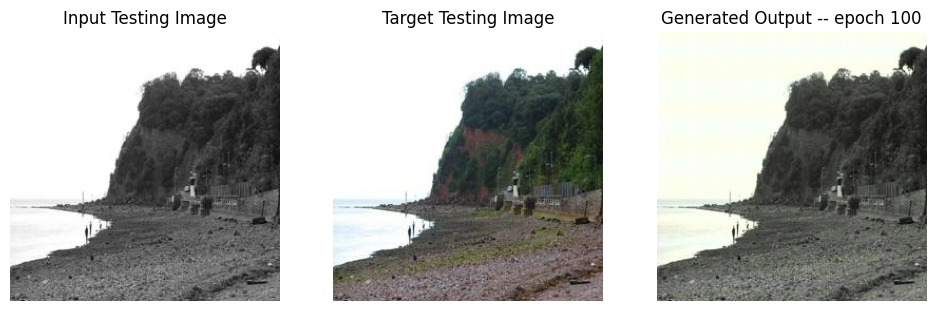

SSIM Score: 0.9153540730476379
PSNR Score: 30.146684646606445


In [43]:
display_random_test_image(gen, '/kaggle/input/places365/val_256/valid_samples/Places365_val_00000117.jpg',100)

In [44]:
os.mkdir('/kaggle/working/modelsFeb10')

In [45]:
import random

each_epoch_train_generator_losses = []
each_epoch_train_generator_gan_losses = []
each_epoch_train_generator_l1_losses = []
each_epoch_train_generator_l2_losses = []
each_epoch_train_generator_perceptual_losses = []
each_epoch_train_discriminator_losses = []
each_epoch_train_discriminator_real_losses = []
each_epoch_train_discriminator_generated_losses = []
each_epoch_train_ssim = []
each_epoch_train_psnr = []
each_epoch_train_lpips = []
each_epoch_test_lpips = []
each_epoch_test_psnr = []
each_epoch_test_ssim = []
each_epoch_test_generator_losses = []
each_epoch_test_generator_gan_losses = []
each_epoch_test_generator_l1_losses = []
each_epoch_test_generator_l2_losses = []
each_epoch_test_generator_perceptual_losses = []
each_epoch_test_discriminator_losses = []
each_epoch_test_discriminator_real_losses = []
each_epoch_test_discriminator_generated_losses = []
train_generator_losses = []
train_generator_gan_losses = []
train_generator_l1_losses = []
train_generator_l2_losses = []
train_generator_perceptual_losses = []
train_discriminator_losses = []
train_discriminator_real_losses = []
train_discriminator_generated_losses = []
test_generator_losses = []
test_generator_gan_losses = []
test_generator_l1_losses = []
test_generator_l2_losses = []
test_generator_perceptual_losses = []
test_discriminator_losses = []
test_discriminator_real_losses = []
test_discriminator_generated_losses =[]
training_ssim = []
training_psnr = []
training_lpips = []
testing_ssim = []
testing_psnr = []
testing_lpips = []
each_epoch_all_records = []
all_records = []
def fit(train_ds, epochs, test_ds, gen_model):

    # Declare global lists
    global each_epoch_train_generator_losses, each_epoch_train_generator_gan_losses, each_epoch_train_generator_l1_losses, each_epoch_train_generator_l2_losses, each_epoch_train_generator_perceptual_losses, each_epoch_train_discriminator_losses,each_epoch_train_discriminator_real_losses, each_epoch_train_discriminator_generated_losses, each_epoch_train_ssim, each_epoch_train_psnr
    global each_epoch_test_psnr, each_epoch_test_ssim, each_epoch_test_generator_losses, each_epoch_test_generator_gan_losses, each_epoch_test_generator_l1_losses, each_epoch_test_generator_l2_losses, each_epoch_test_generator_perceptual_losses, each_epoch_test_discriminator_losses, each_epoch_test_discriminator_real_losses, each_epoch_test_discriminator_generated_losses
    global train_generator_losses, train_generator_gan_losses, train_generator_l1_losses, train_generator_l2_losses, train_generator_perceptual_losses, train_discriminator_losses, train_discriminator_real_losses, train_discriminator_generated_losses, test_generator_losses, test_generator_l2_losses, test_generator_gan_losses, test_generator_l1_losses, test_generator_perceptual_losses, test_discriminator_losses, test_discriminator_real_losses, test_discriminator_generated_losses
    global training_ssim, training_psnr, testing_ssim, testing_psnr, each_epoch_all_records, all_records, LAMBDA, each_epoch_train_lpips, each_epoch_test_lpips, training_lpips, testing_lpips


    # Initialize counters and flags
    consecutive_epochs_high_loss = 0
    training_discriminator = True
    stop_training = False
    min_learning_rate = 1e-7  # Set your desired minimum learning rate
    time_start = time.time()
    
    for epoch in range(epochs):
        start = time.time()
        train_count = 0
        test_count = 0

        print(f"Epoch {epoch}")

        for n, (input_, target) in train_ds.enumerate():
            if epoch > 10:
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss,train_gen_perceptual_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr, train_lpips = train_step(input_, target, epoch, training_discriminator=training_discriminator)

            else:
                # If epoch is less than or equal to 10, train both generator and discriminator
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss, train_gen_perceptual_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr, train_lpips  = train_step(input_, target, epoch, training_discriminator=None)

            each_epoch_train_generator_losses.append(train_gen_loss)
            each_epoch_train_generator_gan_losses.append(train_gen_gan_loss)
            each_epoch_train_generator_l1_losses.append(train_gen_l1_loss)
#             each_epoch_train_generator_l2_losses.append(train_gen_l2_loss)
            each_epoch_train_generator_perceptual_losses.append(train_gen_perceptual_loss)
            each_epoch_train_discriminator_losses.append(train_disc_loss)
            each_epoch_train_discriminator_real_losses.append(train_disc_real_loss)
            each_epoch_train_discriminator_generated_losses.append(train_disc_generated_loss)
            each_epoch_train_ssim.append(tf.reduce_mean(train_ssim.numpy()))
            each_epoch_train_psnr.append(tf.reduce_mean(train_psnr.numpy()))
            each_epoch_train_lpips.append(tf.reduce_mean(train_lpips.numpy()))
#             print(train_count)
            train_count += 1
#             print(n)
        #each_epoch_train_generator_losses = np.array(each_epoch_train_generator_losses)
        #print(each_epoch_train_discriminator_losses.shape())
        #print(each_epoch_train_generator_losses.shape())
        #print(each_epoch_train_ssim())
        print("Training Details")
        print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f} perceptual_loss:{:.5f} Discriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- SSIM {:.5f} PSNR {:.5f} LPIPS {:.5f}".format(np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses),np.mean(each_epoch_train_generator_perceptual_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr), np.mean(each_epoch_train_lpips)))
        print("Time taken for epoch {} is {} sec".format(epoch + 1, time.time() - start))
        print(f"Number of iteration {train_count}")

        train_generator_losses.append(np.mean(each_epoch_train_generator_losses))
        train_generator_gan_losses.append(np.mean(each_epoch_train_generator_gan_losses))
        train_generator_l1_losses.append(np.mean(each_epoch_train_generator_l1_losses))
#         train_generator_l2_losses.append(np.mean(each_epoch_train_generator_l2_losses))
        train_generator_perceptual_losses.append(np.mean(each_epoch_train_generator_perceptual_losses))
        train_discriminator_losses.append(np.mean(each_epoch_train_discriminator_losses))
        train_discriminator_real_losses.append(np.mean(each_epoch_train_discriminator_real_losses))
        train_discriminator_generated_losses.append(np.mean(each_epoch_train_discriminator_generated_losses))
        training_ssim.append(np.mean(each_epoch_train_ssim))
        training_psnr.append(np.mean(each_epoch_train_psnr))
        training_lpips.append(np.mean(each_epoch_train_lpips))

        # Test
        for n, (input_, target) in test_ds.enumerate():
            test_gen_loss, test_gen_gan_loss, test_gen_l1_loss, test_gen_perceptual_loss, test_disc_loss, test_disc_real_loss, test_disc_generated_loss, test_ssim, test_psnr, test_lpips = validation_step(input_, target)
            test_count += 1

            each_epoch_test_generator_losses.append(test_gen_loss)
            each_epoch_test_generator_gan_losses.append(test_gen_gan_loss)
            each_epoch_test_generator_l1_losses.append(test_gen_l1_loss)
#             each_epoch_test_generator_l2_losses.append(test_gen_l2_loss)
            each_epoch_test_generator_perceptual_losses.append(test_gen_perceptual_loss)
            each_epoch_test_discriminator_losses.append(test_disc_loss)
            each_epoch_test_discriminator_real_losses.append(test_disc_real_loss)
            each_epoch_test_discriminator_generated_losses.append(test_disc_generated_loss)
            each_epoch_test_ssim.append(tf.reduce_mean(test_ssim.numpy()))
            each_epoch_test_psnr.append(tf.reduce_mean(test_psnr.numpy()))
            each_epoch_test_lpips.append(tf.reduce_mean(test_lpips.numpy()))
    
        print("Validation Details")
        print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f}  perceptual_loss:{:.5f} Discriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- SSIM {:.5f} PSNR {:.5f} LPIPS {:.5f}".format(np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses), np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr), np.mean(each_epoch_test_lpips)))
        print("Time taken for epoch {} is {} sec".format(epoch+1, time.time() - start))
        print(f"Number of iteration {test_count}")
#         LAMBDA = LAMBDA * 1.006
        test_generator_losses.append(np.mean(each_epoch_test_generator_losses))
        test_generator_gan_losses.append(np.mean(each_epoch_test_generator_gan_losses))
        test_generator_l1_losses.append(np.mean(each_epoch_test_generator_l1_losses))
#         test_generator_l2_losses.append(np.mean(each_epoch_test_generator_l2_losses))
        test_generator_perceptual_losses.append(np.mean(each_epoch_test_generator_perceptual_losses))
        test_discriminator_losses.append(np.mean(each_epoch_test_discriminator_losses))
        test_discriminator_real_losses.append(np.mean(each_epoch_test_discriminator_real_losses))
        test_discriminator_generated_losses.append(np.mean(each_epoch_test_discriminator_generated_losses))
        testing_ssim.append(np.mean(each_epoch_test_ssim))
        testing_psnr.append(np.mean(each_epoch_test_psnr))
        testing_lpips.append(np.mean(each_epoch_test_lpips))

        each_epoch_all_records.append([np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses),np.mean(each_epoch_train_generator_perceptual_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr), np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses),np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr)])
        all_records.append(each_epoch_all_records)
        # emptying for next epoch
        each_epoch_test_ssim = []
        each_epoch_test_generator_losses = []
        each_epoch_test_generator_gan_losses = []
        each_epoch_test_generator_l1_losses = []
#         each_epoch_test_generator_l2_losses = []
        each_epoch_test_generator_perceptual_losses = []
        each_epoch_test_discriminator_losses = []
        each_epoch_test_discriminator_real_losses = []
        each_epoch_test_discriminator_generated_losses = []
        each_epoch_test_psnr = []
        each_epoch_test_lpips = []
        each_epoch_all_records = []
        #emptyling list for next iteration
        each_epoch_train_generator_losses = []
        each_epoch_train_generator_gan_losses = []
        each_epoch_train_generator_l1_losses = []
#         each_epoch_train_generator_l2_losses = []
        each_epoch_train_generator_perceptual_losses = []
        each_epoch_train_discriminator_losses = []
        each_epoch_train_discriminator_real_losses = []
        each_epoch_train_discriminator_generated_losses = []
        each_epoch_train_ssim = []
        each_epoch_train_psnr = []
        each_epoch_train_lpips = []
        if time.time() - time_start > 30000:
            gen.save(f'/kaggle/working/modelsFeb7/gen_coco_{epoch}.h5')
            gen.save_weights(f'/kaggle/working/modelsFeb7/gen_weight_coco_{epoch}.keras')
            disc.save(f'/kaggle/working/modelsFeb7/disc_coco_{epoch}.h5')
            disc.save_weights(f'/kaggle/working/modelsFeb7/disc_weight_coco_{epoch}.keras')
            if 2*(time.time()- start) > 43000- (time.time()-time_start):
                stop_training = True
        if epoch == 0 or epoch % 3 == 0:
            # Function to display one random test image
            # def display_random_test_image(images, labels, gen_model):
            #     # Randomly select an index
            #     random_test_image_idx = random.randint(0, len(images) - 1)

            #     # Extract input and target from the selected index
            #     random_test_input = images[random_test_image_idx]
            #     random_test_target = labels[random_test_image_idx]

            #     # Display the image
            #     display_one_random_test_image(random_test_input, random_test_target, gen_model)

            # Example usage
            display_random_test_image(gen, '/kaggle/input/places365/val_256/valid_samples/Places365_val_00000117.jpg', epoch+1)
        # Check if the difference between two consecutive epochs for the last 5 epochs is less than 1
        if epoch > 10:
            # Check 1f the difference between two consecutive epochs for the last S epochs is less than 1 or 0.3
            last_epochs_losses = train_discriminator_losses[-5:] if training_discriminator else train_generator_losses[-5:]
            if all(((last_epochs_losses[i] - last_epochs_losses[i - 1])) < 0.01 if training_discriminator else ((last_epochs_losses[1] - last_epochs_losses[i - 1])) < 0.05 for i in range(1, 5)):
                consecutive_epochs_high_loss += 1
            else:
                consecutive_epochs_high_loss = 0
        
        
#         LAMBDA = LAMBDA*1.003
            # If the condition is met for 4 consecutive epochs, reduce the learning rate
        if consecutive_epochs_high_loss == 4:
            if training_discriminator:
                current_lr = generator_optimizer. learning_rate.numpy()
                new_lr = max (current_lr * 0.45, min_learning_rate)
                if new_lr > min_learning_rate:
                    generator_optimizer.learning_rate.assign(new_lr)
                    print (f"Reduced generator learning rate to {new_lr} at epoch {epoch + 1}")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Generator learning rate already at the minimum. Stopping training.")
                    stop_training = True
            else:
                current_lr = discriminator_optimizer.learning_rate.numpy()
                new_lr = max (current_lr * 0.3, min_learning_rate)
                if new_lr > min_learning_rate:
                    discriminator_optimizer.learning_rate.assign(new_lr)
                    print(f"Reduced discriminator learning rate to {new_lr} at epoch {epoch + 1}.")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Discriminator learning rate already at the minimum. Stopping training.")
                    stop_training = True

                consecutive_epochs_high_loss = 0
        # Check the flag variable
        if stop_training:
            break

In [46]:
tf.config.run_functions_eagerly(True)

Epoch 0
Training Details
Generator-- total_loss:7.92129 gan_loss:1.26730 l1_loss:0.04753 perceptual_loss:0.00000 Discriminator-- total_loss:1.18982 real_loss:0.59832 generated_loss:0.59150 --- SSIM 0.87910 PSNR 21.69232 LPIPS 0.00000
Time taken for epoch 1 is 679.9248685836792 sec
Number of iteration 685
Validation Details
Generator-- total_loss:7.59519 gan_loss:0.69302 l1_loss:0.04930  perceptual_loss:0.00000 Discriminator-- total_loss:1.27674 real_loss:0.74716 generated_loss:0.52958 --- SSIM 0.93303 PSNR 22.36611 LPIPS 0.00000
Time taken for epoch 1 is 734.2118818759918 sec
Number of iteration 229
Displaying one random test image...


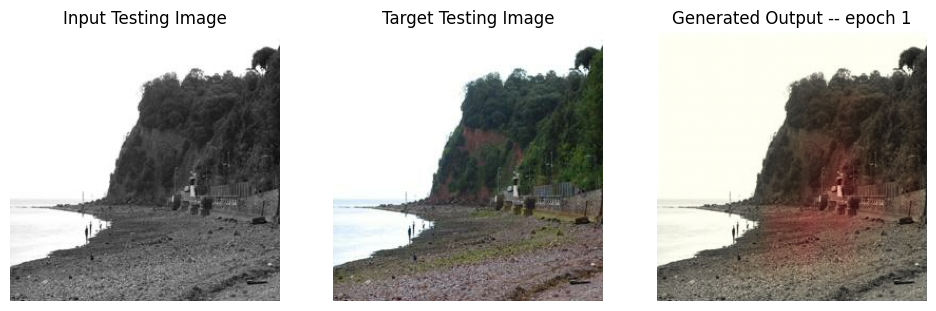

SSIM Score: 0.9713926315307617
PSNR Score: 27.62732696533203
Epoch 1
Training Details
Generator-- total_loss:7.55774 gan_loss:1.13715 l1_loss:0.04586 perceptual_loss:0.00000 Discriminator-- total_loss:1.22337 real_loss:0.60434 generated_loss:0.61903 --- SSIM 0.90966 PSNR 22.09073 LPIPS 0.00000
Time taken for epoch 2 is 671.4506449699402 sec
Number of iteration 685
Validation Details
Generator-- total_loss:28.27154 gan_loss:0.64560 l1_loss:0.19733  perceptual_loss:0.00000 Discriminator-- total_loss:2.84181 real_loss:1.54279 generated_loss:1.29901 --- SSIM 0.63725 PSNR 11.12684 LPIPS 0.00000
Time taken for epoch 2 is 725.4730131626129 sec
Number of iteration 229
Epoch 2
Training Details
Generator-- total_loss:7.67455 gan_loss:1.34408 l1_loss:0.04522 perceptual_loss:0.00000 Discriminator-- total_loss:1.80049 real_loss:0.89144 generated_loss:0.90905 --- SSIM 0.91551 PSNR 22.28598 LPIPS 0.00000
Time taken for epoch 3 is 670.9998507499695 sec
Number of iteration 685
Validation Details
Genera

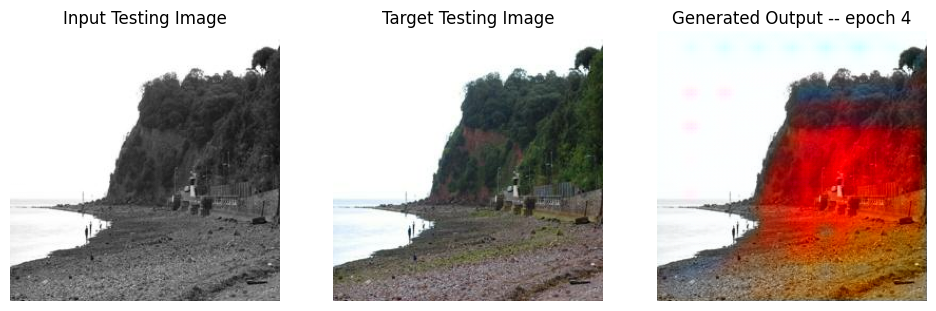

SSIM Score: 0.7400169968605042
PSNR Score: 14.717216491699219
Epoch 4
Training Details
Generator-- total_loss:7.29146 gan_loss:0.97454 l1_loss:0.04512 perceptual_loss:0.00000 Discriminator-- total_loss:1.24119 real_loss:0.60579 generated_loss:0.63540 --- SSIM 0.91700 PSNR 22.25371 LPIPS 0.00000
Time taken for epoch 5 is 671.4535038471222 sec
Number of iteration 685
Validation Details
Generator-- total_loss:10.49802 gan_loss:0.56542 l1_loss:0.07095  perceptual_loss:0.00000 Discriminator-- total_loss:1.57111 real_loss:1.12044 generated_loss:0.45067 --- SSIM 0.84834 PSNR 19.00928 LPIPS 0.00000
Time taken for epoch 5 is 725.7101857662201 sec
Number of iteration 229
Epoch 5
Training Details
Generator-- total_loss:7.30932 gan_loss:0.97757 l1_loss:0.04523 perceptual_loss:0.00000 Discriminator-- total_loss:1.24786 real_loss:0.60768 generated_loss:0.64018 --- SSIM 0.91859 PSNR 22.26662 LPIPS 0.00000
Time taken for epoch 6 is 671.3144986629486 sec
Number of iteration 685
Validation Details
Gener

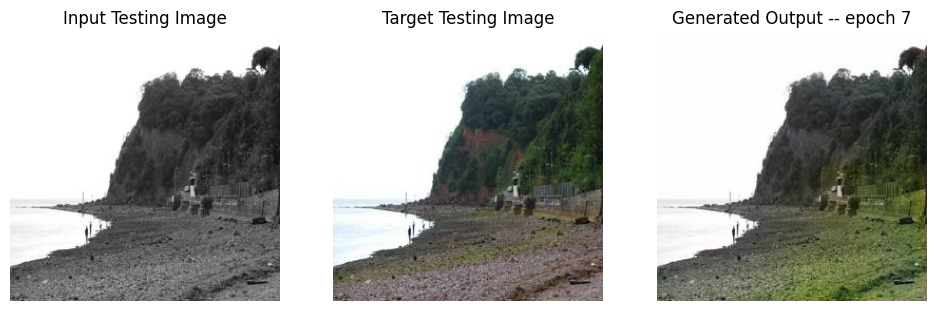

SSIM Score: 0.982351541519165
PSNR Score: 28.23784828186035
Epoch 7
Training Details
Generator-- total_loss:7.31015 gan_loss:0.97676 l1_loss:0.04524 perceptual_loss:0.00000 Discriminator-- total_loss:1.27553 real_loss:0.62443 generated_loss:0.65111 --- SSIM 0.91726 PSNR 22.28423 LPIPS 0.00000
Time taken for epoch 8 is 669.4065947532654 sec
Number of iteration 685
Validation Details
Generator-- total_loss:7.82034 gan_loss:0.92527 l1_loss:0.04925  perceptual_loss:0.00000 Discriminator-- total_loss:1.32876 real_loss:0.56067 generated_loss:0.76809 --- SSIM 0.89226 PSNR 21.86756 LPIPS 0.00000
Time taken for epoch 8 is 723.2185125350952 sec
Number of iteration 229
Epoch 8
Training Details
Generator-- total_loss:7.27583 gan_loss:0.98149 l1_loss:0.04496 perceptual_loss:0.00000 Discriminator-- total_loss:1.28301 real_loss:0.62419 generated_loss:0.65882 --- SSIM 0.91930 PSNR 22.35959 LPIPS 0.00000
Time taken for epoch 9 is 670.2567138671875 sec
Number of iteration 685
Validation Details
Generato

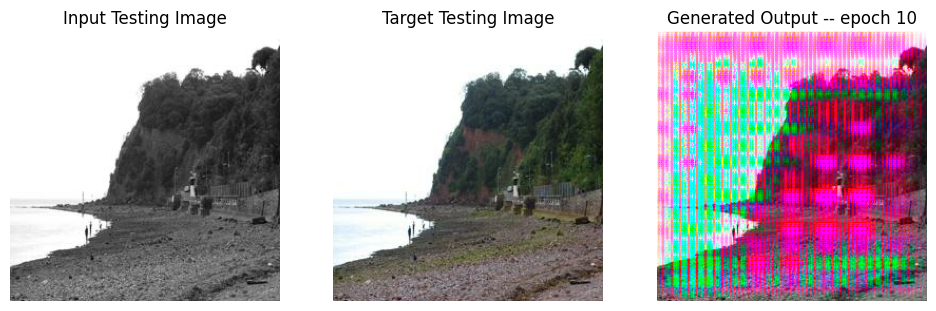

SSIM Score: 0.10085633397102356
PSNR Score: 5.845195293426514
Epoch 10
Training Details
Generator-- total_loss:6.35062 gan_loss:0.64191 l1_loss:0.04078 perceptual_loss:0.00000 Discriminator-- total_loss:1.13788 real_loss:0.83353 generated_loss:0.30435 --- SSIM 0.92821 PSNR 21.75496 LPIPS 0.00000
Time taken for epoch 11 is 412.2797725200653 sec
Number of iteration 685
Validation Details
Generator-- total_loss:6.85391 gan_loss:0.38661 l1_loss:0.04619  perceptual_loss:0.00000 Discriminator-- total_loss:1.59363 real_loss:1.21393 generated_loss:0.37970 --- SSIM 0.93050 PSNR 22.22486 LPIPS 0.00000
Time taken for epoch 11 is 466.8000433444977 sec
Number of iteration 229
Epoch 11
Training Details
Generator-- total_loss:15.19476 gan_loss:9.48710 l1_loss:0.04077 perceptual_loss:0.00000 Discriminator-- total_loss:0.01802 real_loss:0.00890 generated_loss:0.00911 --- SSIM 0.92849 PSNR 21.67545 LPIPS 0.00000
Time taken for epoch 12 is 441.09260511398315 sec
Number of iteration 685
Validation Details

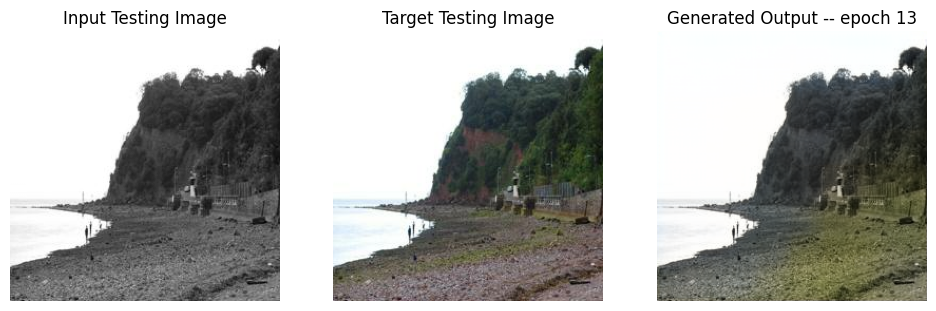

SSIM Score: 0.9864853024482727
PSNR Score: 30.508275985717773
Epoch 13
Training Details
Generator-- total_loss:16.40367 gan_loss:10.69916 l1_loss:0.04075 perceptual_loss:0.00000 Discriminator-- total_loss:0.22384 real_loss:0.10632 generated_loss:0.11752 --- SSIM 0.92852 PSNR 21.69277 LPIPS 0.00000
Time taken for epoch 14 is 440.8387315273285 sec
Number of iteration 685
Validation Details
Generator-- total_loss:9.06917 gan_loss:2.60911 l1_loss:0.04614  perceptual_loss:0.00000 Discriminator-- total_loss:1.51344 real_loss:1.05341 generated_loss:0.46003 --- SSIM 0.92437 PSNR 22.73399 LPIPS 0.00000
Time taken for epoch 14 is 495.34990906715393 sec
Number of iteration 229
Epoch 14
Training Details
Generator-- total_loss:17.82906 gan_loss:12.11994 l1_loss:0.04078 perceptual_loss:0.00000 Discriminator-- total_loss:0.00368 real_loss:0.00230 generated_loss:0.00138 --- SSIM 0.92839 PSNR 21.69682 LPIPS 0.00000
Time taken for epoch 15 is 440.98587822914124 sec
Number of iteration 685
Validation Det

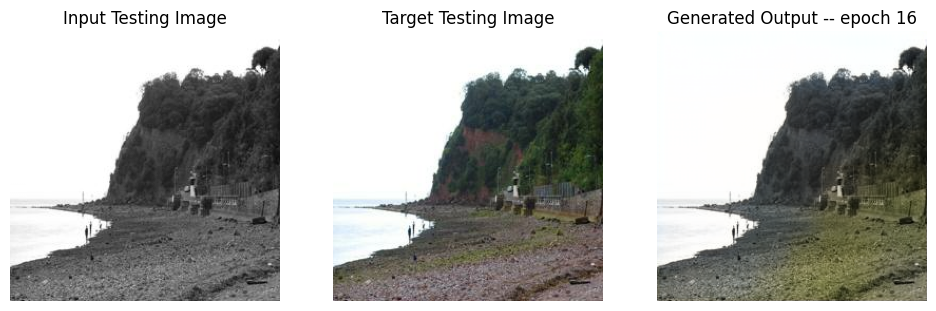

SSIM Score: 0.9867250323295593
PSNR Score: 30.675207138061523
Epoch 16
Training Details
Generator-- total_loss:18.42421 gan_loss:12.71888 l1_loss:0.04075 perceptual_loss:0.00000 Discriminator-- total_loss:0.11344 real_loss:0.05051 generated_loss:0.06293 --- SSIM 0.92859 PSNR 21.68792 LPIPS 0.00000
Time taken for epoch 17 is 439.65455436706543 sec
Number of iteration 685
Validation Details
Generator-- total_loss:10.58971 gan_loss:4.12106 l1_loss:0.04620  perceptual_loss:0.00000 Discriminator-- total_loss:2.75355 real_loss:1.82995 generated_loss:0.92360 --- SSIM 0.92431 PSNR 22.72150 LPIPS 0.00000
Time taken for epoch 17 is 494.03056502342224 sec
Number of iteration 229
Epoch 17
Training Details
Generator-- total_loss:19.75028 gan_loss:14.04304 l1_loss:0.04077 perceptual_loss:0.00000 Discriminator-- total_loss:0.00017 real_loss:0.00010 generated_loss:0.00007 --- SSIM 0.92849 PSNR 21.69171 LPIPS 0.00000
Time taken for epoch 18 is 440.3057301044464 sec
Number of iteration 685
Validation De

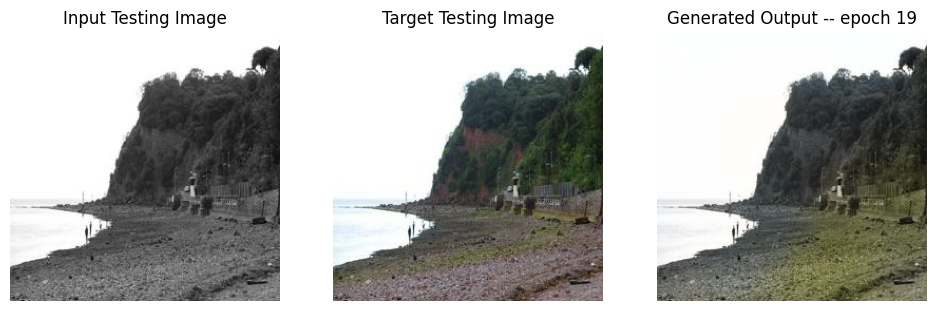

SSIM Score: 0.9866423606872559
PSNR Score: 30.61425018310547
Epoch 19
Training Details
Generator-- total_loss:21.80787 gan_loss:16.09451 l1_loss:0.04081 perceptual_loss:0.00000 Discriminator-- total_loss:0.00018 real_loss:0.00012 generated_loss:0.00005 --- SSIM 0.92856 PSNR 21.68444 LPIPS 0.00000
Time taken for epoch 20 is 440.56038427352905 sec
Number of iteration 685
Validation Details
Generator-- total_loss:8.76658 gan_loss:2.20841 l1_loss:0.04684  perceptual_loss:0.00000 Discriminator-- total_loss:2.15805 real_loss:1.36418 generated_loss:0.79388 --- SSIM 0.92246 PSNR 22.61276 LPIPS 0.00000
Time taken for epoch 20 is 494.82917308807373 sec
Number of iteration 229
Epoch 20
Training Details
Generator-- total_loss:21.72078 gan_loss:16.01630 l1_loss:0.04075 perceptual_loss:0.00000 Discriminator-- total_loss:0.00002 real_loss:0.00001 generated_loss:0.00001 --- SSIM 0.92857 PSNR 21.69754 LPIPS 0.00000
Time taken for epoch 21 is 440.1371612548828 sec
Number of iteration 685
Validation Deta

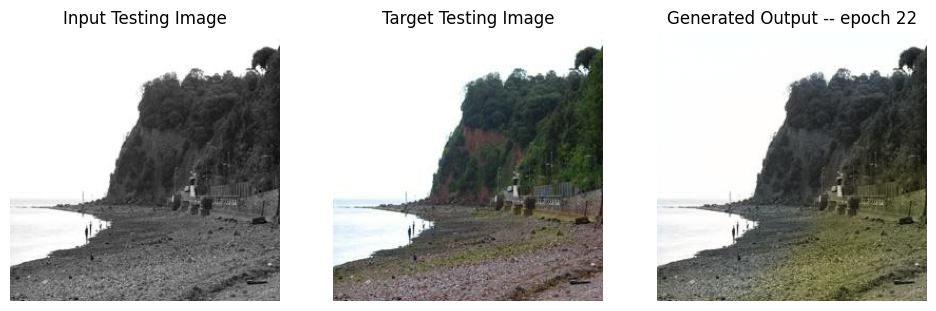

SSIM Score: 0.9866693615913391
PSNR Score: 30.63094139099121
Epoch 22
Training Details
Generator-- total_loss:21.47045 gan_loss:15.77150 l1_loss:0.04071 perceptual_loss:0.00000 Discriminator-- total_loss:0.00005 real_loss:0.00003 generated_loss:0.00002 --- SSIM 0.92853 PSNR 21.67301 LPIPS 0.00000
Time taken for epoch 23 is 439.0513114929199 sec
Number of iteration 685
Validation Details
Generator-- total_loss:8.74719 gan_loss:2.26135 l1_loss:0.04633  perceptual_loss:0.00000 Discriminator-- total_loss:7.06639 real_loss:6.57113 generated_loss:0.49526 --- SSIM 0.92386 PSNR 22.69888 LPIPS 0.00000
Time taken for epoch 23 is 493.10372614860535 sec
Number of iteration 229
Epoch 23
Training Details
Generator-- total_loss:23.61513 gan_loss:17.91293 l1_loss:0.04073 perceptual_loss:0.00000 Discriminator-- total_loss:0.39953 real_loss:0.16733 generated_loss:0.23220 --- SSIM 0.92857 PSNR 21.69679 LPIPS 0.00000
Time taken for epoch 24 is 439.479966878891 sec
Number of iteration 685
Validation Detail

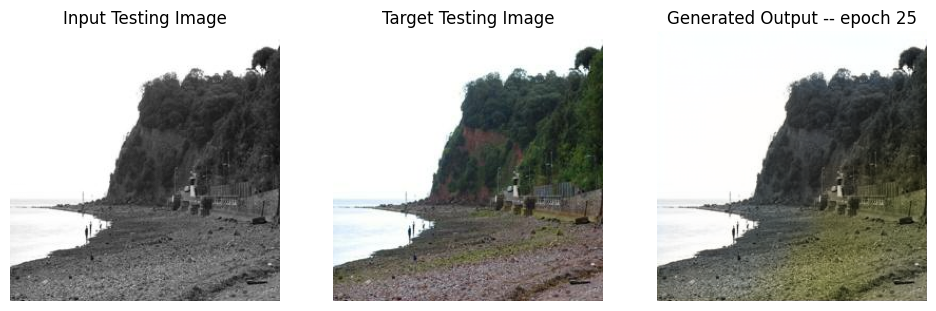

SSIM Score: 0.9867086410522461
PSNR Score: 30.659204483032227
Epoch 25
Training Details
Generator-- total_loss:25.53831 gan_loss:19.83652 l1_loss:0.04073 perceptual_loss:0.00000 Discriminator-- total_loss:0.00084 real_loss:0.00031 generated_loss:0.00053 --- SSIM 0.92866 PSNR 21.68424 LPIPS 0.00000
Time taken for epoch 26 is 440.19708037376404 sec
Number of iteration 685
Validation Details
Generator-- total_loss:10.36844 gan_loss:3.90099 l1_loss:0.04620  perceptual_loss:0.00000 Discriminator-- total_loss:4.93437 real_loss:4.05661 generated_loss:0.87776 --- SSIM 0.92388 PSNR 22.72841 LPIPS 0.00000
Time taken for epoch 26 is 494.40822196006775 sec
Number of iteration 229
Epoch 26
Training Details
Generator-- total_loss:24.62536 gan_loss:18.91863 l1_loss:0.04076 perceptual_loss:0.00000 Discriminator-- total_loss:0.00006 real_loss:0.00003 generated_loss:0.00004 --- SSIM 0.92853 PSNR 21.68181 LPIPS 0.00000
Time taken for epoch 27 is 441.34502482414246 sec
Number of iteration 685
Validation D

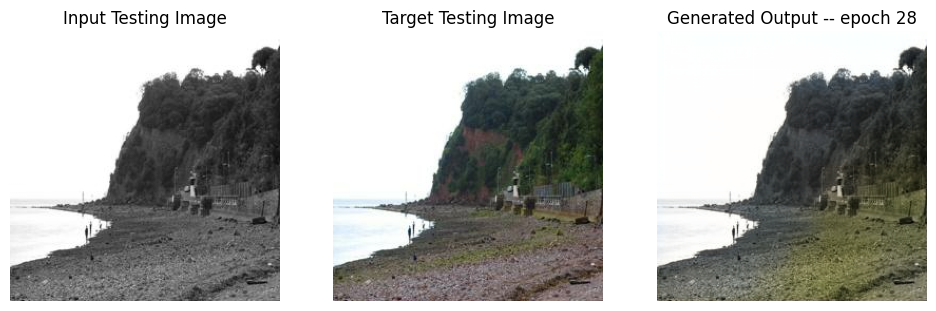

SSIM Score: 0.9867217540740967
PSNR Score: 30.65882682800293
Epoch 28
Training Details
Generator-- total_loss:25.13795 gan_loss:19.43024 l1_loss:0.04077 perceptual_loss:0.00000 Discriminator-- total_loss:0.00001 real_loss:0.00001 generated_loss:0.00000 --- SSIM 0.92853 PSNR 21.67685 LPIPS 0.00000
Time taken for epoch 29 is 440.773312330246 sec
Number of iteration 685
Validation Details
Generator-- total_loss:9.84345 gan_loss:3.33779 l1_loss:0.04647  perceptual_loss:0.00000 Discriminator-- total_loss:3.50881 real_loss:2.04913 generated_loss:1.45967 --- SSIM 0.92347 PSNR 22.67870 LPIPS 0.00000
Time taken for epoch 29 is 494.7396152019501 sec
Number of iteration 229
Epoch 29
Training Details
Generator-- total_loss:25.26088 gan_loss:19.55459 l1_loss:0.04076 perceptual_loss:0.00000 Discriminator-- total_loss:0.00001 real_loss:0.00001 generated_loss:0.00001 --- SSIM 0.92856 PSNR 21.68735 LPIPS 0.00000
Time taken for epoch 30 is 439.0582809448242 sec
Number of iteration 685
Validation Details

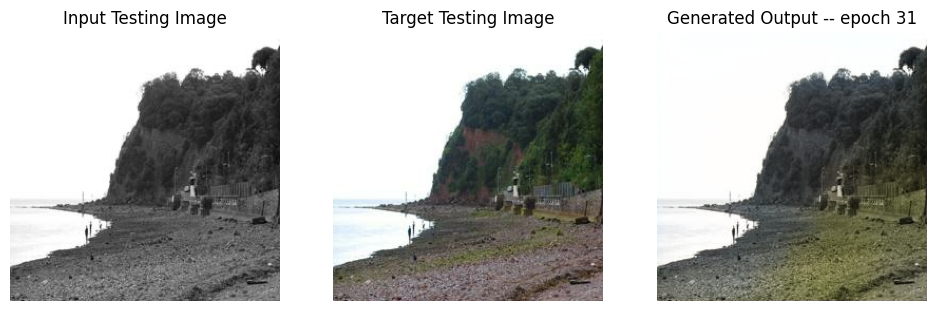

SSIM Score: 0.9866330623626709
PSNR Score: 30.60360336303711
Reduced generator learning rate to 0.0004500000213738531 at epoch 31
Epoch 31
Training Details
Generator-- total_loss:5.00956 gan_loss:0.06894 l1_loss:0.03529 perceptual_loss:0.00000 Discriminator-- total_loss:70.85474 real_loss:70.85473 generated_loss:0.00000 --- SSIM 0.94865 PSNR 24.93311 LPIPS 0.00000
Time taken for epoch 32 is 412.5880115032196 sec
Number of iteration 685
Validation Details
Generator-- total_loss:5.45848 gan_loss:0.00000 l1_loss:0.03899  perceptual_loss:0.00000 Discriminator-- total_loss:54.17078 real_loss:54.17078 generated_loss:0.00000 --- SSIM 0.94700 PSNR 24.43101 LPIPS 0.00000
Time taken for epoch 32 is 467.0234386920929 sec
Number of iteration 229
Epoch 32
Training Details
Generator-- total_loss:4.86612 gan_loss:0.00000 l1_loss:0.03476 perceptual_loss:0.00000 Discriminator-- total_loss:68.90744 real_loss:68.90743 generated_loss:0.00001 --- SSIM 0.95064 PSNR 25.06994 LPIPS 0.00000
Time taken for epoc

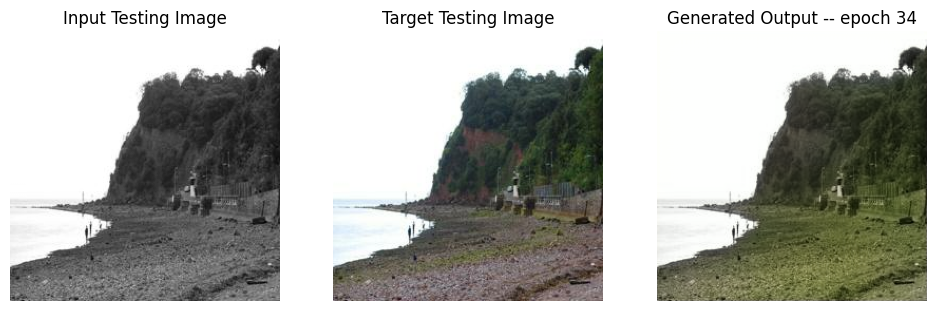

SSIM Score: 0.9809341430664062
PSNR Score: 27.589113235473633
Epoch 34
Training Details
Generator-- total_loss:4.85014 gan_loss:0.00001 l1_loss:0.03464 perceptual_loss:0.00000 Discriminator-- total_loss:69.00132 real_loss:69.00132 generated_loss:0.00000 --- SSIM 0.95096 PSNR 25.09953 LPIPS 0.00000
Time taken for epoch 35 is 412.53895258903503 sec
Number of iteration 685
Validation Details
Generator-- total_loss:5.54046 gan_loss:0.00000 l1_loss:0.03957  perceptual_loss:0.00000 Discriminator-- total_loss:52.64720 real_loss:52.64720 generated_loss:0.00000 --- SSIM 0.94744 PSNR 24.44695 LPIPS 0.00000
Time taken for epoch 35 is 467.0089957714081 sec
Number of iteration 229
Epoch 35
Training Details
Generator-- total_loss:4.84653 gan_loss:0.00001 l1_loss:0.03462 perceptual_loss:0.00000 Discriminator-- total_loss:68.24590 real_loss:68.24590 generated_loss:0.00001 --- SSIM 0.95103 PSNR 25.10680 LPIPS 0.00000
Time taken for epoch 36 is 412.18839621543884 sec
Number of iteration 685
Validation D

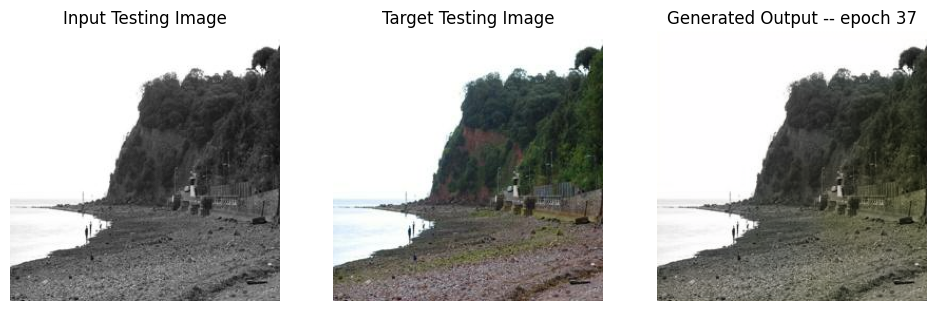

SSIM Score: 0.9896716475486755
PSNR Score: 33.78364562988281
Epoch 37
Training Details
Generator-- total_loss:4.82923 gan_loss:0.00000 l1_loss:0.03449 perceptual_loss:0.00000 Discriminator-- total_loss:67.63605 real_loss:67.63604 generated_loss:0.00002 --- SSIM 0.95124 PSNR 25.12592 LPIPS 0.00000
Time taken for epoch 38 is 411.4588167667389 sec
Number of iteration 685
Validation Details
Generator-- total_loss:5.43494 gan_loss:0.00000 l1_loss:0.03882  perceptual_loss:0.00000 Discriminator-- total_loss:49.79867 real_loss:49.79867 generated_loss:0.00001 --- SSIM 0.94798 PSNR 24.55385 LPIPS 0.00000
Time taken for epoch 38 is 465.6150677204132 sec
Number of iteration 229
Epoch 38
Training Details
Generator-- total_loss:4.81846 gan_loss:0.00001 l1_loss:0.03442 perceptual_loss:0.00000 Discriminator-- total_loss:66.92686 real_loss:66.92686 generated_loss:0.00000 --- SSIM 0.95129 PSNR 25.14583 LPIPS 0.00000
Time taken for epoch 39 is 411.46567821502686 sec
Number of iteration 685
Validation Det

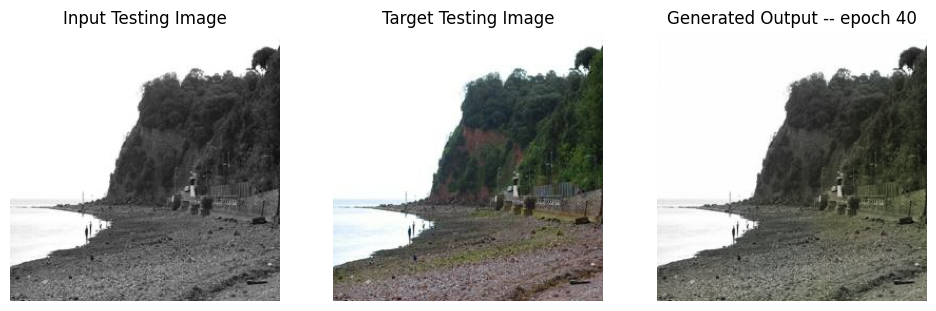

SSIM Score: 0.989797055721283
PSNR Score: 33.80797576904297
Epoch 40
Training Details
Generator-- total_loss:20.47265 gan_loss:15.64885 l1_loss:0.03446 perceptual_loss:0.00000 Discriminator-- total_loss:0.00176 real_loss:0.00085 generated_loss:0.00092 --- SSIM 0.95146 PSNR 25.21868 LPIPS 0.00000
Time taken for epoch 41 is 439.9728810787201 sec
Number of iteration 685
Validation Details
Generator-- total_loss:5.37531 gan_loss:0.00749 l1_loss:0.03834  perceptual_loss:0.00000 Discriminator-- total_loss:5.97838 real_loss:5.96569 generated_loss:0.01269 --- SSIM 0.94788 PSNR 24.67286 LPIPS 0.00000
Time taken for epoch 41 is 493.72959876060486 sec
Number of iteration 229
Epoch 41
Training Details
Generator-- total_loss:22.40488 gan_loss:17.58266 l1_loss:0.03444 perceptual_loss:0.00000 Discriminator-- total_loss:0.00195 real_loss:0.00014 generated_loss:0.00182 --- SSIM 0.95147 PSNR 25.21949 LPIPS 0.00000
Time taken for epoch 42 is 438.62615966796875 sec
Number of iteration 685
Validation Detai

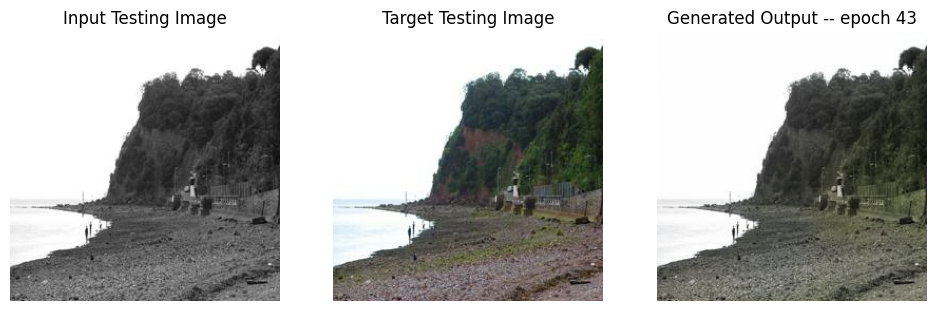

SSIM Score: 0.9898011088371277
PSNR Score: 33.808467864990234
Epoch 43
Training Details
Generator-- total_loss:23.75027 gan_loss:18.92646 l1_loss:0.03446 perceptual_loss:0.00000 Discriminator-- total_loss:0.00028 real_loss:0.00012 generated_loss:0.00015 --- SSIM 0.95146 PSNR 25.21136 LPIPS 0.00000
Time taken for epoch 44 is 438.675142288208 sec
Number of iteration 685
Validation Details
Generator-- total_loss:5.39315 gan_loss:0.02071 l1_loss:0.03837  perceptual_loss:0.00000 Discriminator-- total_loss:5.15835 real_loss:5.13210 generated_loss:0.02625 --- SSIM 0.94781 PSNR 24.65478 LPIPS 0.00000
Time taken for epoch 44 is 492.54589796066284 sec
Number of iteration 229
Epoch 44
Training Details
Generator-- total_loss:24.05169 gan_loss:19.22683 l1_loss:0.03446 perceptual_loss:0.00000 Discriminator-- total_loss:0.00020 real_loss:0.00009 generated_loss:0.00011 --- SSIM 0.95144 PSNR 25.21755 LPIPS 0.00000
Time taken for epoch 45 is 439.25730204582214 sec
Number of iteration 685
Validation Deta

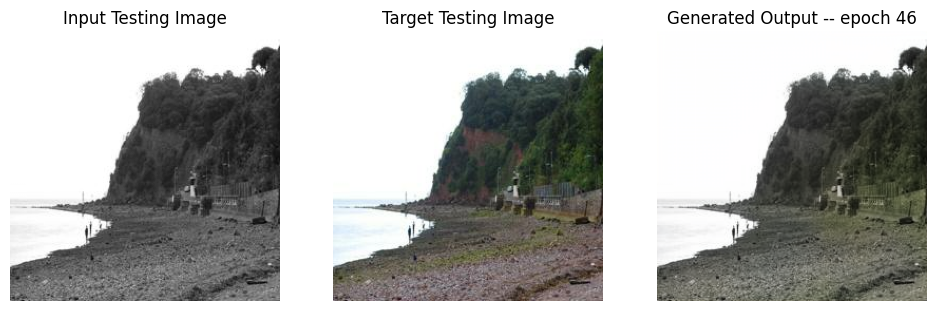

SSIM Score: 0.9897961616516113
PSNR Score: 33.806060791015625
Epoch 46
Training Details
Generator-- total_loss:26.55038 gan_loss:21.72881 l1_loss:0.03444 perceptual_loss:0.00000 Discriminator-- total_loss:0.00006 real_loss:0.00003 generated_loss:0.00003 --- SSIM 0.95144 PSNR 25.21651 LPIPS 0.00000
Time taken for epoch 47 is 439.0362021923065 sec
Number of iteration 685
Validation Details
Generator-- total_loss:5.38053 gan_loss:0.00449 l1_loss:0.03840  perceptual_loss:0.00000 Discriminator-- total_loss:6.84409 real_loss:6.83299 generated_loss:0.01110 --- SSIM 0.94773 PSNR 24.64580 LPIPS 0.00000
Time taken for epoch 47 is 493.0113453865051 sec
Number of iteration 229
Epoch 47
Training Details
Generator-- total_loss:28.22191 gan_loss:23.39771 l1_loss:0.03446 perceptual_loss:0.00000 Discriminator-- total_loss:0.01222 real_loss:0.00496 generated_loss:0.00725 --- SSIM 0.95141 PSNR 25.21502 LPIPS 0.00000
Time taken for epoch 48 is 439.4054822921753 sec
Number of iteration 685
Validation Detai

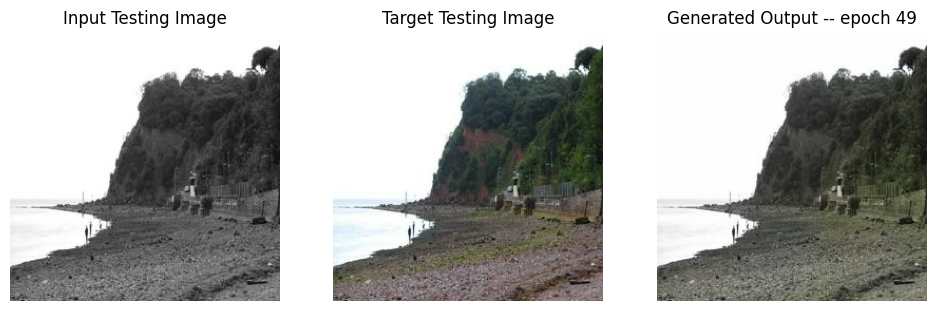

SSIM Score: 0.9897937774658203
PSNR Score: 33.775325775146484
Epoch 49
Training Details
Generator-- total_loss:29.59760 gan_loss:24.77243 l1_loss:0.03447 perceptual_loss:0.00000 Discriminator-- total_loss:0.00010 real_loss:0.00003 generated_loss:0.00007 --- SSIM 0.95146 PSNR 25.21411 LPIPS 0.00000
Time taken for epoch 50 is 440.0264811515808 sec
Number of iteration 685
Validation Details
Generator-- total_loss:5.36854 gan_loss:0.00149 l1_loss:0.03834  perceptual_loss:0.00000 Discriminator-- total_loss:10.51687 real_loss:10.51342 generated_loss:0.00345 --- SSIM 0.94776 PSNR 24.65793 LPIPS 0.00000
Time taken for epoch 50 is 494.0456576347351 sec
Number of iteration 229
Epoch 50
Training Details
Generator-- total_loss:35.22455 gan_loss:30.40168 l1_loss:0.03445 perceptual_loss:0.00000 Discriminator-- total_loss:0.00025 real_loss:0.00017 generated_loss:0.00008 --- SSIM 0.95149 PSNR 25.21567 LPIPS 0.00000
Time taken for epoch 51 is 439.7596740722656 sec
Number of iteration 685
Validation Det

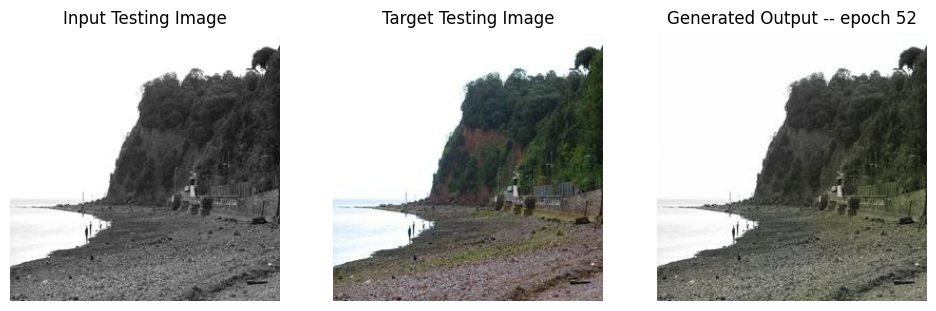

SSIM Score: 0.9897944927215576
PSNR Score: 33.79027557373047
Epoch 52
Training Details
Generator-- total_loss:35.97326 gan_loss:31.14808 l1_loss:0.03447 perceptual_loss:0.00000 Discriminator-- total_loss:0.00002 real_loss:0.00001 generated_loss:0.00001 --- SSIM 0.95143 PSNR 25.21248 LPIPS 0.00000
Time taken for epoch 53 is 440.2173845767975 sec
Number of iteration 685
Validation Details
Generator-- total_loss:5.36990 gan_loss:0.00083 l1_loss:0.03835  perceptual_loss:0.00000 Discriminator-- total_loss:10.30548 real_loss:10.30238 generated_loss:0.00310 --- SSIM 0.94768 PSNR 24.67034 LPIPS 0.00000
Time taken for epoch 53 is 494.0630359649658 sec
Number of iteration 229
Epoch 53
Training Details
Generator-- total_loss:36.27010 gan_loss:31.44891 l1_loss:0.03444 perceptual_loss:0.00000 Discriminator-- total_loss:0.00001 real_loss:0.00000 generated_loss:0.00001 --- SSIM 0.95153 PSNR 25.21903 LPIPS 0.00000
Time taken for epoch 54 is 439.61850905418396 sec
Number of iteration 685
Validation Det

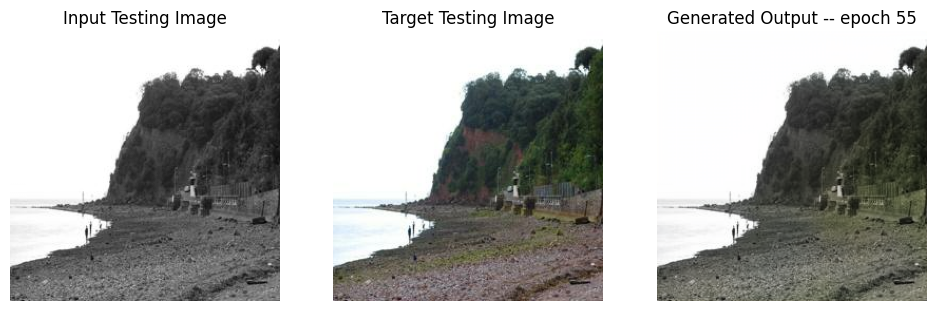

SSIM Score: 0.9897940754890442
PSNR Score: 33.79281234741211
Reduced generator learning rate to 0.0002025000096182339 at epoch 55
Epoch 55
Training Details
Generator-- total_loss:5.04896 gan_loss:0.06967 l1_loss:0.03557 perceptual_loss:0.00000 Discriminator-- total_loss:14.17387 real_loss:14.17387 generated_loss:0.00000 --- SSIM 0.94628 PSNR 24.82450 LPIPS 0.00000
Time taken for epoch 56 is 412.13699412345886 sec
Number of iteration 685
Validation Details
Generator-- total_loss:6.09187 gan_loss:0.00000 l1_loss:0.04351  perceptual_loss:0.00000 Discriminator-- total_loss:18.83594 real_loss:18.83589 generated_loss:0.00005 --- SSIM 0.94104 PSNR 23.79028 LPIPS 0.00000
Time taken for epoch 56 is 466.00393748283386 sec
Number of iteration 229
Epoch 56
Training Details
Generator-- total_loss:4.88494 gan_loss:0.01009 l1_loss:0.03482 perceptual_loss:0.00000 Discriminator-- total_loss:12.77418 real_loss:12.77418 generated_loss:0.00000 --- SSIM 0.94757 PSNR 24.96822 LPIPS 0.00000
Time taken for ep

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Displaying one random test image...


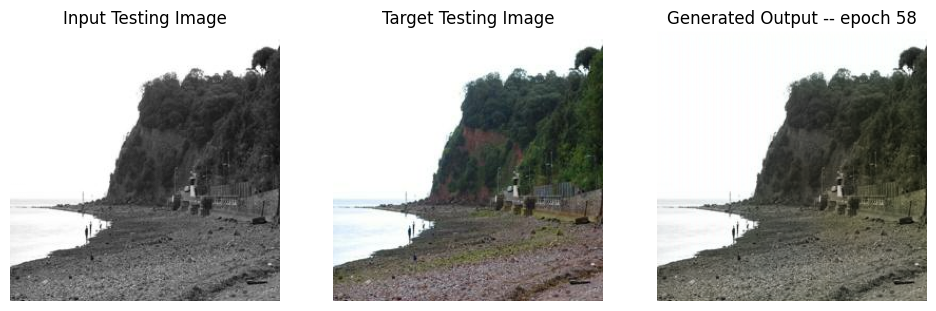

SSIM Score: 0.9800498485565186
PSNR Score: 33.94879150390625
Epoch 58
Training Details
Generator-- total_loss:4.85601 gan_loss:0.00921 l1_loss:0.03462 perceptual_loss:0.00000 Discriminator-- total_loss:12.39762 real_loss:12.39762 generated_loss:0.00000 --- SSIM 0.94809 PSNR 24.99133 LPIPS 0.00000
Time taken for epoch 59 is 411.324914932251 sec
Number of iteration 685
Validation Details
Generator-- total_loss:5.53589 gan_loss:0.00001 l1_loss:0.03954  perceptual_loss:0.00000 Discriminator-- total_loss:17.03205 real_loss:17.03196 generated_loss:0.00009 --- SSIM 0.94458 PSNR 24.24511 LPIPS 0.00000
Time taken for epoch 59 is 465.298823595047 sec
Number of iteration 229
Epoch 59
Training Details
Generator-- total_loss:4.84986 gan_loss:0.00903 l1_loss:0.03458 perceptual_loss:0.00000 Discriminator-- total_loss:12.23024 real_loss:12.23023 generated_loss:0.00000 --- SSIM 0.94799 PSNR 24.99323 LPIPS 0.00000
Time taken for epoch 60 is 410.9638044834137 sec
Number of iteration 685
Validation Detail

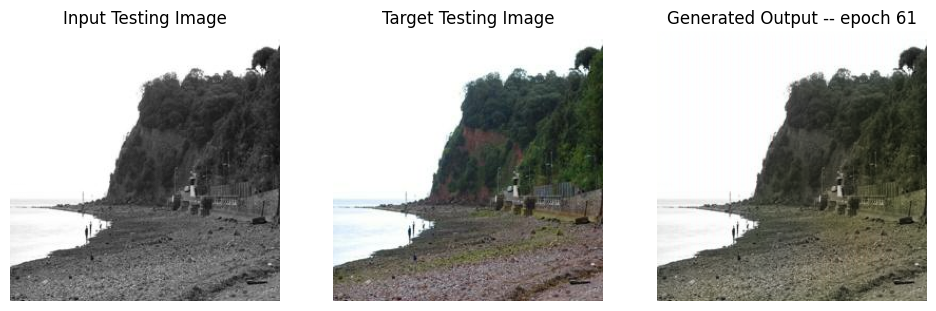

SSIM Score: 0.9762316346168518
PSNR Score: 32.917396545410156
Epoch 61
Training Details
Generator-- total_loss:4.84436 gan_loss:0.00873 l1_loss:0.03454 perceptual_loss:0.00000 Discriminator-- total_loss:12.39608 real_loss:12.39608 generated_loss:0.00000 --- SSIM 0.94801 PSNR 24.97530 LPIPS 0.00000
Time taken for epoch 62 is 411.512953042984 sec
Number of iteration 685
Validation Details
Generator-- total_loss:5.59306 gan_loss:0.00001 l1_loss:0.03995  perceptual_loss:0.00000 Discriminator-- total_loss:18.03949 real_loss:18.03944 generated_loss:0.00006 --- SSIM 0.94477 PSNR 24.09966 LPIPS 0.00000
Time taken for epoch 62 is 465.59185242652893 sec
Number of iteration 229
Epoch 62
Training Details
Generator-- total_loss:4.82617 gan_loss:0.00742 l1_loss:0.03442 perceptual_loss:0.00000 Discriminator-- total_loss:12.22900 real_loss:12.22899 generated_loss:0.00000 --- SSIM 0.94817 PSNR 25.00353 LPIPS 0.00000
Time taken for epoch 63 is 413.0356159210205 sec
Number of iteration 685
Validation Det

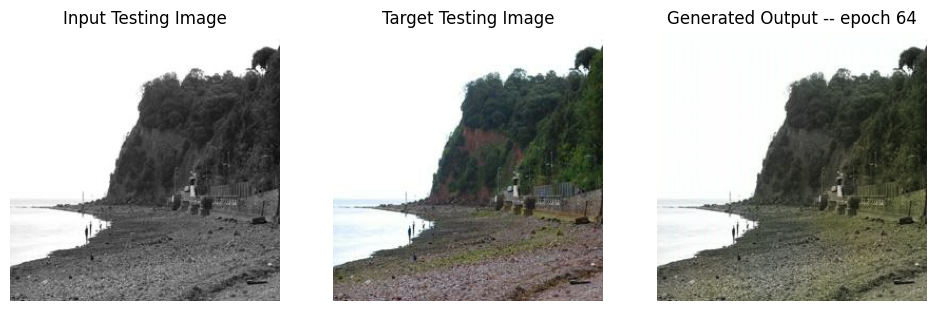

SSIM Score: 0.9809050559997559
PSNR Score: 32.49777603149414
Epoch 64
Training Details
Generator-- total_loss:16.45415 gan_loss:11.64526 l1_loss:0.03435 perceptual_loss:0.00000 Discriminator-- total_loss:0.00615 real_loss:0.00256 generated_loss:0.00360 --- SSIM 0.94824 PSNR 24.96561 LPIPS 0.00000
Time taken for epoch 65 is 441.81541109085083 sec
Number of iteration 685
Validation Details
Generator-- total_loss:5.71888 gan_loss:0.32205 l1_loss:0.03855  perceptual_loss:0.00000 Discriminator-- total_loss:4.02830 real_loss:3.55974 generated_loss:0.46856 --- SSIM 0.94490 PSNR 24.37516 LPIPS 0.00000
Time taken for epoch 65 is 496.4926028251648 sec
Number of iteration 229
Epoch 65
Training Details
Generator-- total_loss:17.33747 gan_loss:12.52513 l1_loss:0.03437 perceptual_loss:0.00000 Discriminator-- total_loss:0.00405 real_loss:0.00177 generated_loss:0.00227 --- SSIM 0.94818 PSNR 24.95736 LPIPS 0.00000
Time taken for epoch 66 is 442.2423286437988 sec
Number of iteration 685
Validation Detai

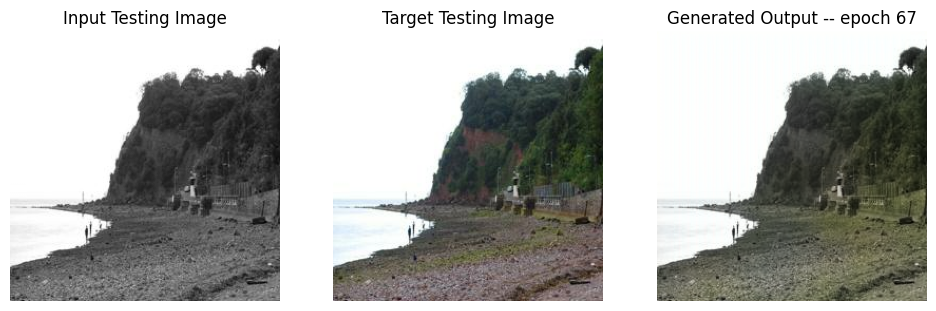

SSIM Score: 0.9812443852424622
PSNR Score: 32.63512420654297
Epoch 67
Training Details
Generator-- total_loss:19.13330 gan_loss:14.32435 l1_loss:0.03435 perceptual_loss:0.00000 Discriminator-- total_loss:0.00223 real_loss:0.00065 generated_loss:0.00159 --- SSIM 0.94819 PSNR 24.96850 LPIPS 0.00000
Time taken for epoch 68 is 441.696928024292 sec
Number of iteration 685
Validation Details
Generator-- total_loss:5.63604 gan_loss:0.23896 l1_loss:0.03855  perceptual_loss:0.00000 Discriminator-- total_loss:4.39808 real_loss:4.14627 generated_loss:0.25181 --- SSIM 0.94483 PSNR 24.38318 LPIPS 0.00000
Time taken for epoch 68 is 496.47307777404785 sec
Number of iteration 229
Epoch 68
Training Details
Generator-- total_loss:19.70910 gan_loss:14.89842 l1_loss:0.03436 perceptual_loss:0.00000 Discriminator-- total_loss:0.00107 real_loss:0.00062 generated_loss:0.00045 --- SSIM 0.94818 PSNR 24.96722 LPIPS 0.00000
Time taken for epoch 69 is 441.99421072006226 sec
Number of iteration 685
Validation Detai

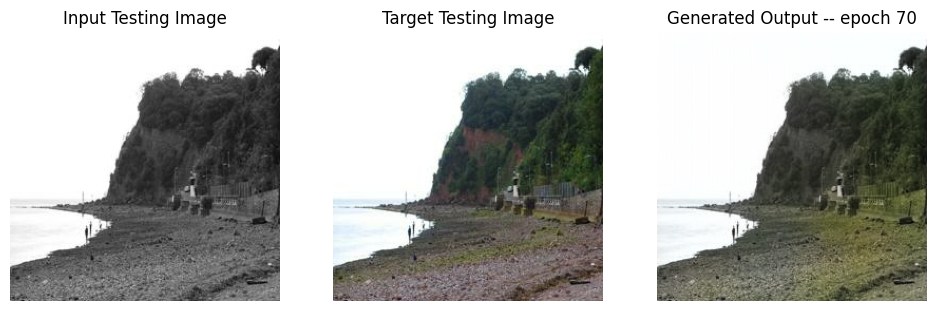

SSIM Score: 0.9804623126983643
PSNR Score: 31.080026626586914
Epoch 70
Training Details
Generator-- total_loss:4.97803 gan_loss:0.01777 l1_loss:0.03543 perceptual_loss:0.00000 Discriminator-- total_loss:10.06120 real_loss:10.06073 generated_loss:0.00046 --- SSIM 0.94677 PSNR 24.71813 LPIPS 0.00000
Time taken for epoch 71 is 412.7961416244507 sec
Number of iteration 685
Validation Details
Generator-- total_loss:5.56539 gan_loss:0.00002 l1_loss:0.03975  perceptual_loss:0.00000 Discriminator-- total_loss:16.30114 real_loss:16.29763 generated_loss:0.00351 --- SSIM 0.94288 PSNR 24.13523 LPIPS 0.00000
Time taken for epoch 71 is 467.2498586177826 sec
Number of iteration 229
Epoch 71
Training Details
Generator-- total_loss:4.96213 gan_loss:0.01617 l1_loss:0.03533 perceptual_loss:0.00000 Discriminator-- total_loss:10.04708 real_loss:10.04627 generated_loss:0.00081 --- SSIM 0.94679 PSNR 24.74921 LPIPS 0.00000
Time taken for epoch 72 is 412.82120156288147 sec
Number of iteration 685
Validation De

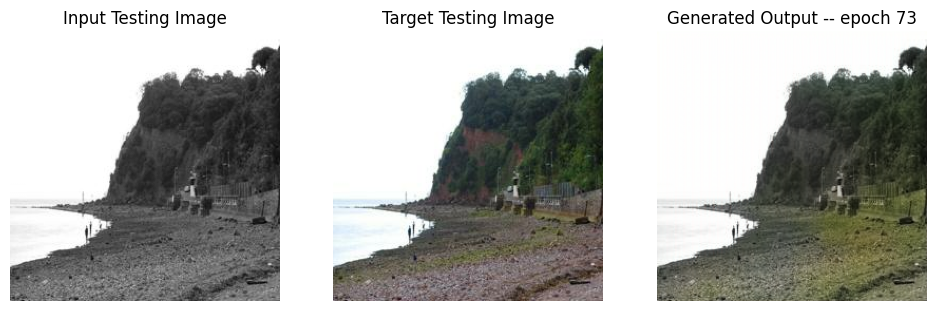

SSIM Score: 0.9825599789619446
PSNR Score: 30.721040725708008
Epoch 73
Training Details
Generator-- total_loss:4.94011 gan_loss:0.01498 l1_loss:0.03518 perceptual_loss:0.00000 Discriminator-- total_loss:9.74924 real_loss:9.74855 generated_loss:0.00069 --- SSIM 0.94652 PSNR 24.78420 LPIPS 0.00000
Time taken for epoch 74 is 410.43943214416504 sec
Number of iteration 685
Validation Details
Generator-- total_loss:5.66998 gan_loss:0.00004 l1_loss:0.04050  perceptual_loss:0.00000 Discriminator-- total_loss:15.49925 real_loss:15.49548 generated_loss:0.00376 --- SSIM 0.94123 PSNR 23.83241 LPIPS 0.00000
Time taken for epoch 74 is 464.6387040615082 sec
Number of iteration 229
Epoch 74
Training Details
Generator-- total_loss:4.94569 gan_loss:0.01500 l1_loss:0.03522 perceptual_loss:0.00000 Discriminator-- total_loss:9.62655 real_loss:9.62609 generated_loss:0.00045 --- SSIM 0.94640 PSNR 24.77999 LPIPS 0.00000
Time taken for epoch 75 is 411.6493363380432 sec
Number of iteration 685
Validation Detail

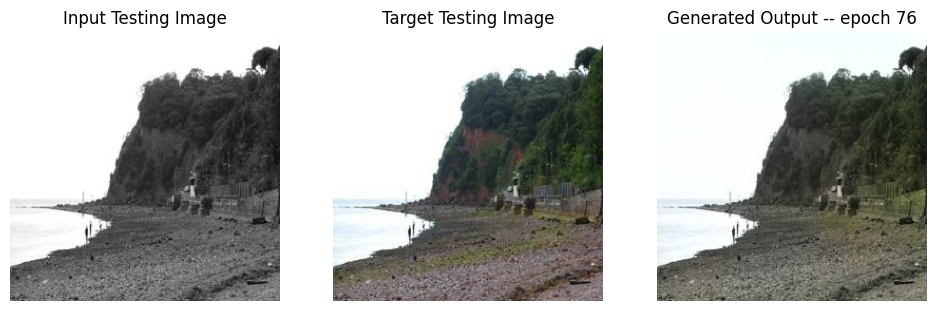

SSIM Score: 0.9827149510383606
PSNR Score: 33.586734771728516
Epoch 76
Training Details
Generator-- total_loss:4.93550 gan_loss:0.01398 l1_loss:0.03515 perceptual_loss:0.00000 Discriminator-- total_loss:9.76198 real_loss:9.76149 generated_loss:0.00049 --- SSIM 0.94627 PSNR 24.79517 LPIPS 0.00000
Time taken for epoch 77 is 410.9714891910553 sec
Number of iteration 685
Validation Details
Generator-- total_loss:5.48401 gan_loss:0.00003 l1_loss:0.03917  perceptual_loss:0.00000 Discriminator-- total_loss:16.18056 real_loss:16.17664 generated_loss:0.00392 --- SSIM 0.94319 PSNR 24.35285 LPIPS 0.00000
Time taken for epoch 77 is 464.82737827301025 sec
Number of iteration 229
Reduced discriminator learning rate to 2.700000040931627e-05 at epoch 77.
Epoch 77
Training Details
Generator-- total_loss:14.64119 gan_loss:9.73772 l1_loss:0.03502 perceptual_loss:0.00000 Discriminator-- total_loss:0.10744 real_loss:0.05365 generated_loss:0.05378 --- SSIM 0.94652 PSNR 24.84540 LPIPS 0.00000
Time taken for 

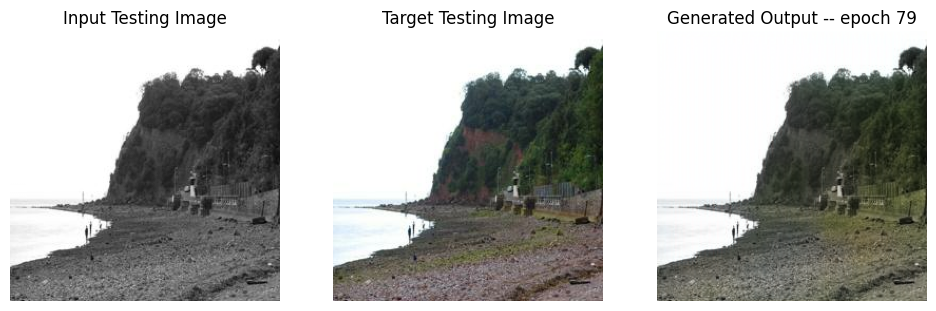

SSIM Score: 0.9861106276512146
PSNR Score: 33.18292236328125
Epoch 79
Training Details
Generator-- total_loss:16.86985 gan_loss:11.96254 l1_loss:0.03505 perceptual_loss:0.00000 Discriminator-- total_loss:0.02607 real_loss:0.01029 generated_loss:0.01577 --- SSIM 0.94649 PSNR 24.84308 LPIPS 0.00000
Time taken for epoch 80 is 439.25572443008423 sec
Number of iteration 685
Validation Details
Generator-- total_loss:5.62949 gan_loss:0.09323 l1_loss:0.03954  perceptual_loss:0.00000 Discriminator-- total_loss:5.35281 real_loss:5.24367 generated_loss:0.10914 --- SSIM 0.94222 PSNR 24.20005 LPIPS 0.00000
Time taken for epoch 80 is 493.0723702907562 sec
Number of iteration 229
Epoch 80
Training Details
Generator-- total_loss:17.35921 gan_loss:12.44647 l1_loss:0.03509 perceptual_loss:0.00000 Discriminator-- total_loss:0.02161 real_loss:0.00749 generated_loss:0.01411 --- SSIM 0.94646 PSNR 24.83556 LPIPS 0.00000
Time taken for epoch 81 is 439.3064339160919 sec
Number of iteration 685
Validation Detai

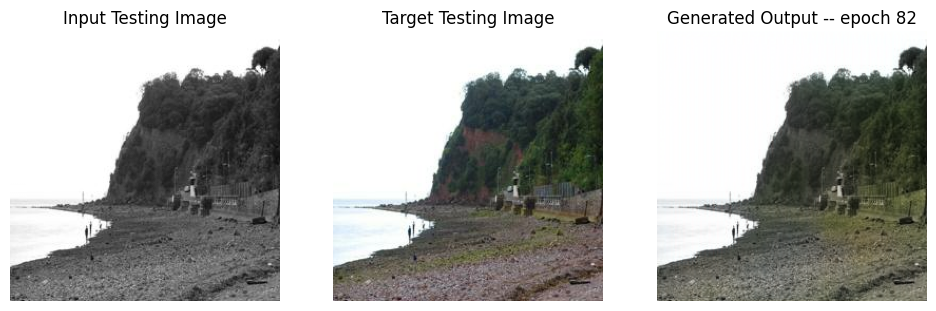

SSIM Score: 0.9862089157104492
PSNR Score: 33.197723388671875
Epoch 82
Training Details
Generator-- total_loss:17.97066 gan_loss:13.06013 l1_loss:0.03508 perceptual_loss:0.00000 Discriminator-- total_loss:0.01061 real_loss:0.00428 generated_loss:0.00633 --- SSIM 0.94647 PSNR 24.83875 LPIPS 0.00000
Time taken for epoch 83 is 439.33510065078735 sec
Number of iteration 685
Validation Details
Generator-- total_loss:5.61460 gan_loss:0.07487 l1_loss:0.03957  perceptual_loss:0.00000 Discriminator-- total_loss:5.93887 real_loss:5.85253 generated_loss:0.08634 --- SSIM 0.94222 PSNR 24.19429 LPIPS 0.00000
Time taken for epoch 83 is 493.33465003967285 sec
Number of iteration 229
Reduced generator learning rate to 4.100625446881168e-05 at epoch 83


In [47]:
fit(train_dataset, epochs, validation_dataset, gen)

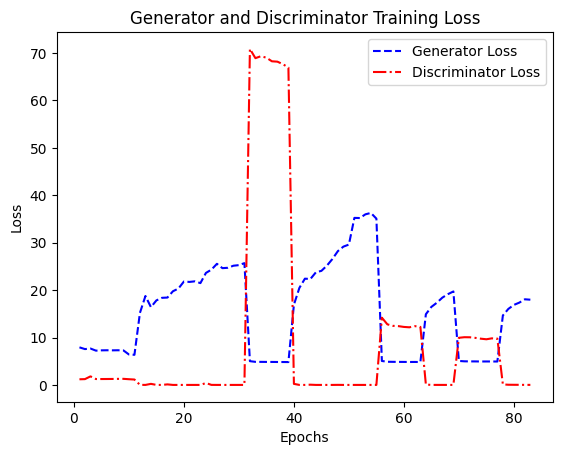

In [48]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_losses, '--b', label='Generator Loss')
plt.plot(epochs, train_discriminator_losses, '-.r', label='Discriminator Loss')
plt.title('Generator and Discriminator Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/train_loss_plot_1.png')
plt.show()

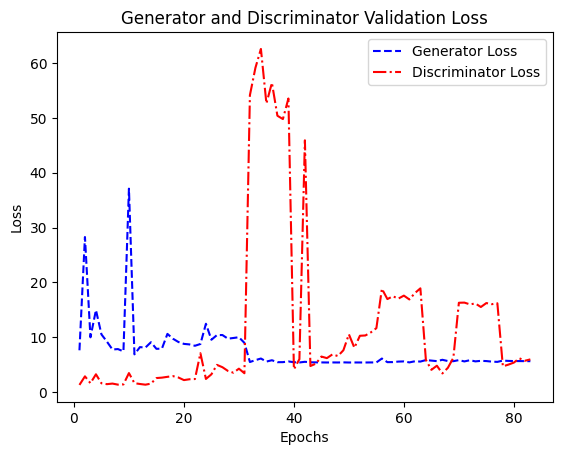

In [49]:
epochs = range(1, len(test_generator_losses) + 1)

plt.plot(epochs, test_generator_losses, '--b', label='Generator Loss')
plt.plot(epochs, test_discriminator_losses, '-.r', label='Discriminator Loss')
plt.title('Generator and Discriminator Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/test_loss_plot_1.png')
plt.show()

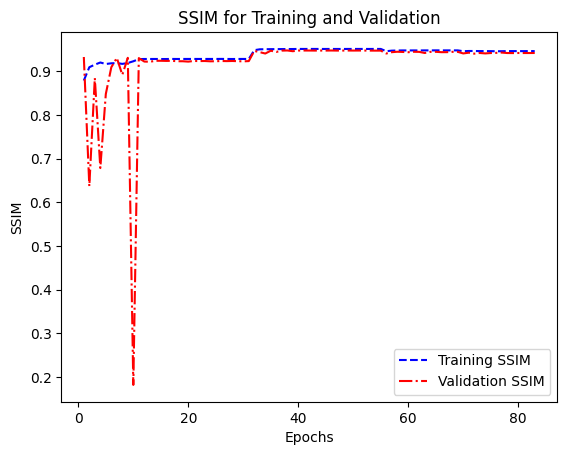

In [50]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_ssim, '--b', label='Training SSIM')
plt.plot(epochs, testing_ssim, '-.r', label='Validation SSIM')
plt.title('SSIM for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('SSIM')
plt.legend()
plt.savefig('/kaggle/working/SSIM_plot_1.png')
plt.show()

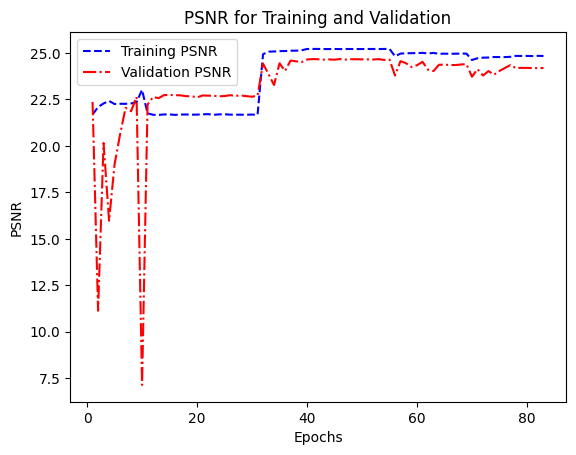

In [51]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_psnr, '--b', label='Training PSNR')
plt.plot(epochs, testing_psnr, '-.r', label='Validation PSNR')
plt.title('PSNR for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('PSNR')
plt.legend()
plt.savefig('/kaggle/working/PSNR_plot_1.png')
plt.show()

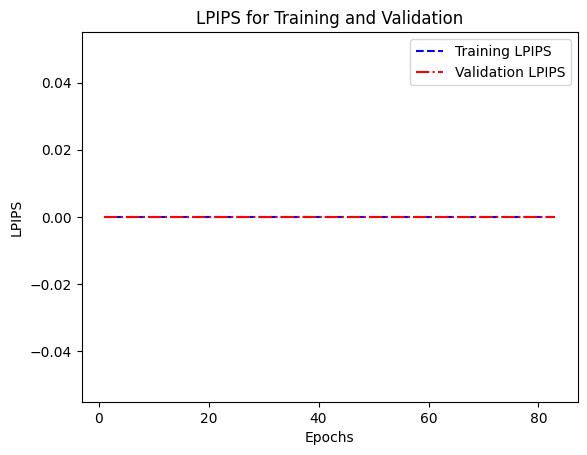

In [52]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_lpips, '--b', label='Training LPIPS')
plt.plot(epochs, testing_lpips, '-.r', label='Validation LPIPS')
plt.title('LPIPS for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('LPIPS')
plt.legend()
plt.savefig('/kaggle/working/LPIPS_plot_1.png')
plt.show()

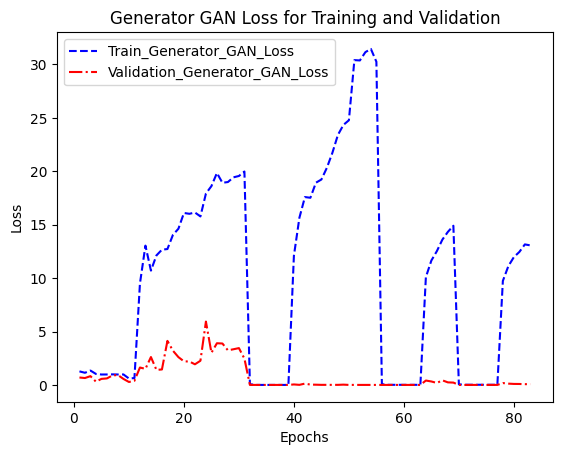

In [53]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_gan_losses, '--b', label='Train_Generator_GAN_Loss')
plt.plot(epochs, test_generator_gan_losses, '-.r', label='Validation_Generator_GAN_Loss')
plt.title('Generator GAN Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_GAN_plot_1.png')
plt.show()

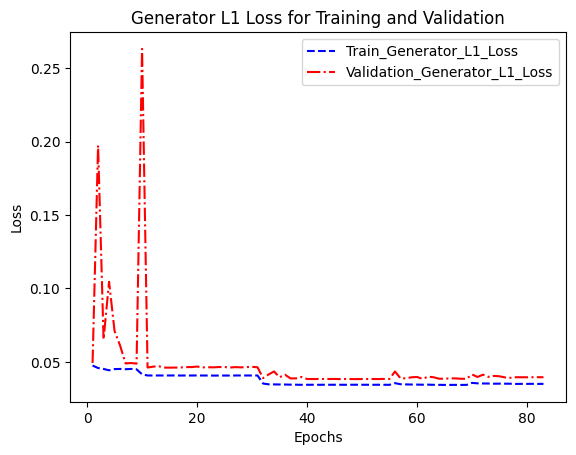

In [54]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_l1_losses, '--b', label='Train_Generator_L1_Loss')
plt.plot(epochs, test_generator_l1_losses, '-.r', label='Validation_Generator_L1_Loss')
plt.title('Generator L1 Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_L1_plot_1.png')
plt.show()

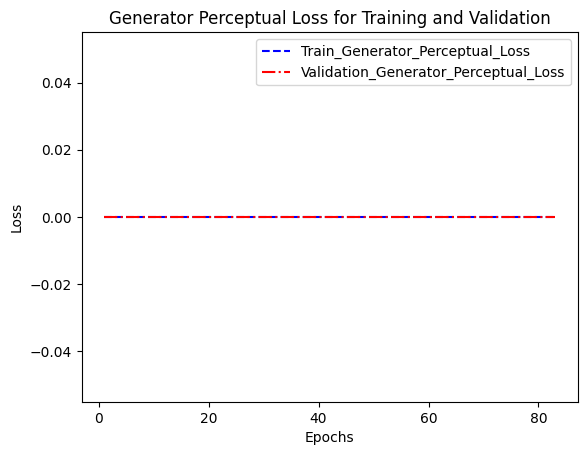

In [55]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_perceptual_losses, '--b', label='Train_Generator_Perceptual_Loss')
plt.plot(epochs, test_generator_perceptual_losses, '-.r', label='Validation_Generator_Perceptual_Loss')
plt.title('Generator Perceptual Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_Perceptual_plot_1.png')
plt.show()

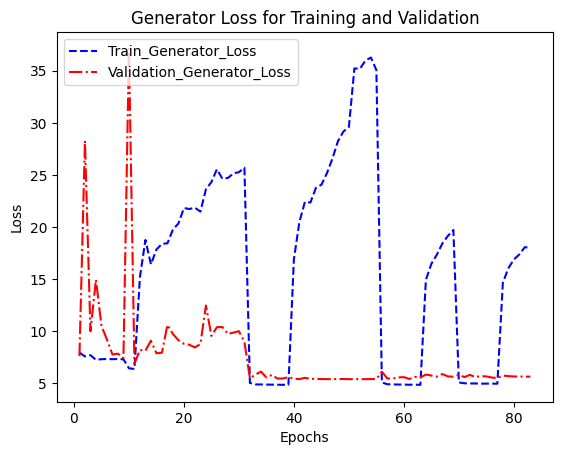

In [56]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_losses, '--b', label='Train_Generator_Loss')
plt.plot(epochs, test_generator_losses, '-.r', label='Validation_Generator_Loss')
plt.title('Generator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_plot_1.png')
plt.show()

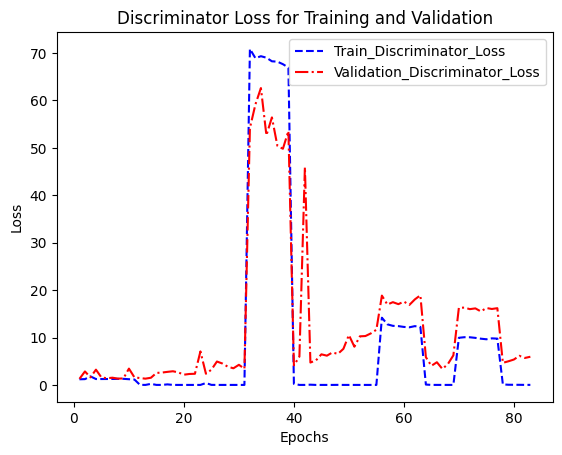

In [57]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_losses, '--b', label='Train_Discriminator_Loss')
plt.plot(epochs, test_discriminator_losses, '-.r', label='Validation_Discriminator_Loss')
plt.title('Discriminator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_plot_1.png')
plt.show()

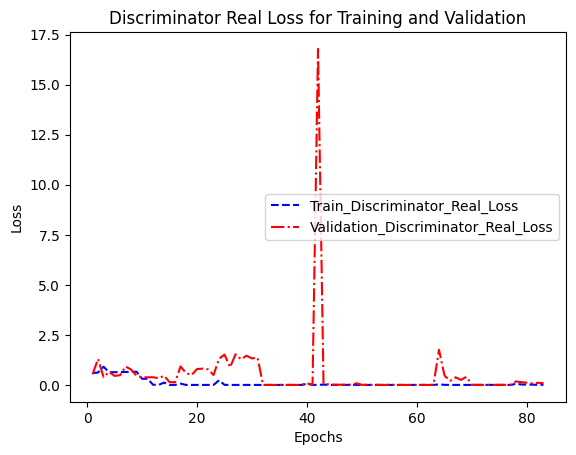

In [58]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_real_losses, '--b', label='Train_Discriminator_Real_Loss')
plt.plot(epochs, test_discriminator_real_losses, '-.r', label='Validation_Discriminator_Real_Loss')
plt.title('Discriminator Real Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Real_plot_1.png')
plt.show()

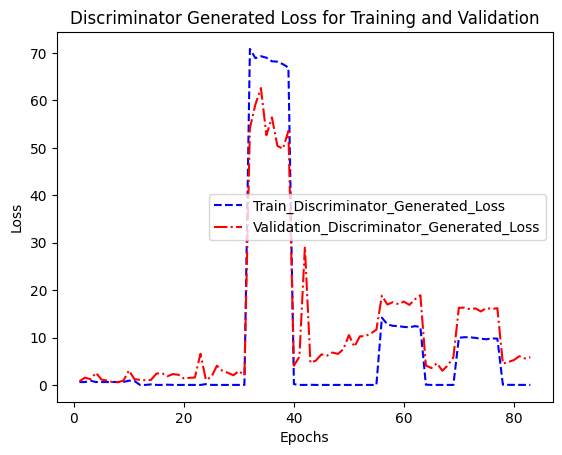

In [59]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_generated_losses, '--b', label='Train_Discriminator_Generated_Loss')
plt.plot(epochs, test_discriminator_generated_losses, '-.r', label='Validation_Discriminator_Generated_Loss')
plt.title('Discriminator Generated Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Generated_plot_1.png')
plt.show()

In [60]:
import csv
with open('/kaggle/working/dataJan20.csv','w', newline='') as file:
    writer = csv.writer(file)
    writer.writerows(all_records)

In [61]:
# # Evaluation on testing data


# each_epoch_test_lpips = []
# each_epoch_test_psnr = []
# each_epoch_test_ssim = []
# each_epoch_test_fid = []
# each_epoch_test_generator_losses = []
# each_epoch_test_generator_gan_losses = []
# each_epoch_test_generator_l1_losses = []
# each_epoch_test_generator_l2_losses = []
# each_epoch_test_generator_perceptual_losses = []
# each_epoch_test_discriminator_losses = []
# each_epoch_test_discriminator_real_losses = []
# each_epoch_test_discriminator_generated_losses = []

# for n, (input_, target) in test_dataset.enumerate():
#     test_gen_loss, test_gen_gan_loss, test_gen_l1_loss, test_gen_perceptual_loss, test_disc_loss, test_disc_real_loss, test_disc_generated_loss, test_ssim, test_psnr, test_lpips, test_fid = test_step(input_, target)

#     each_epoch_test_generator_losses.append(test_gen_loss)
#     each_epoch_test_generator_gan_losses.append(test_gen_gan_loss)
#     each_epoch_test_generator_l1_losses.append(test_gen_l1_loss)
# #             each_epoch_test_generator_l2_losses.append(test_gen_l2_loss)
#     each_epoch_test_generator_perceptual_losses.append(test_gen_perceptual_loss)
#     each_epoch_test_discriminator_losses.append(test_disc_loss)
#     each_epoch_test_discriminator_real_losses.append(test_disc_real_loss)
#     each_epoch_test_discriminator_generated_losses.append(test_disc_generated_loss)
#     each_epoch_test_ssim.append(tf.reduce_mean(test_ssim.numpy()))
#     each_epoch_test_psnr.append(tf.reduce_mean(test_psnr.numpy()))
#     each_epoch_test_lpips.append(tf.reduce_mean(test_lpips.numpy()))
#     each_epoch_test_fid.append(test_fid)
#     print(test_fid)

# print("Testing Details")
# print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f}  perceptual_loss:{:.5f} \nDiscriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- \nSSIM {:.5f} \nPSNR {:.5f} \nLPIPS {:.5f} \nFID Score: {:.5f}".format(np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses), np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr), np.mean(each_epoch_test_lpips), np.mean(each_epoch_test_fid)))

In [62]:
def download_file(path, download_file_name):
    os.chdir('/kaggle/working/')
    zip_name = f"/kaggle/working/{download_file_name}.zip"
    command = f"zip {zip_name} {path} -r"
    result = subprocess.run(command, shell=True, capture_output=True, text=True)
    if result.returncode !=0:
        print("Unable to run zip command")
        print(result.stderr)
        return
    display(FileLink(f'{download_file_name}.zip'))

In [63]:
import subprocess
from IPython.display import FileLink, display

In [64]:
download_file('/kaggle/working', 'outputFeb8')

/kaggle/working/outputFeb8.zip